In [1]:
from analysis.analyze_results import *
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
from collections import defaultdict

In [2]:
# output_base_folder = Path("/home/ivan/Documents/git/storage-benchmarking/src/benchmark_output")
output_base_folder = Path("/iarai/home/ivan.svogor/git/storage-benchmarking/src/benchmark_output")

In [3]:
s3_folder_filter="1711-cache/s3/*benchmark_e2e*"
scratch_folder_filter="1711-cache/scratch/*benchmark_e2e*"
# s3_folder_filter="2810/*benchmark_e2e*"

In [4]:
def extract_timelines(output_base_folder: Path, folder_filter: str = "**", filter_by_metadata: Dict[str, List[str]] = None,
):
    files = list(output_base_folder.rglob(f"{folder_filter}/timeline-*.log"))
    data = []
    for working_file_path in tqdm.tqdm(files, total=len(files)):
        results = parse_results_log(working_file_path)
        if len(results) == 0:
            continue
        results = pd.DataFrame.from_records(data=results)
        results = pd.merge(results[results["end_time"].isnull()], 
                           results[results["start_time"].isnull()], 
                           left_on='id', 
                           right_on='id').drop(['end_time_x', 'start_time_y'], axis=1)
        results["source_file"] = working_file_path
        results["run"] = working_file_path.parent.name
        # filter out old data format missing dataset etc.
        data.append(results)
    df = pd.concat(data)
    df.groupby
    return df


In [5]:
def show_timelines(df, run, flat=False, zoom=False, zoom_epochs = 1):
    fig, ax = plt.subplots(figsize=(30, 20))
    # fig, ax = plt.subplots()
    data = defaultdict(list)
    start = min(df["start_time_x"]) 
    end = max(df["end_time_y"])
    
    total_runtime = (end - start)
    number_of_epochs = 20
    
    if zoom:
        df = df[df["start_time_x"] < start+((total_runtime / number_of_epochs) * zoom_epochs)]
    
    i = 0
    for index, row in df.sort_values(["start_time_x"], ascending=True).iterrows():
        duration = row["end_time_y"] - row["start_time_x"] 
        x1 = row["start_time_x"] - start 
        if duration < 0.08:
            duration = 0.1
        x2 = x1 + duration
        if not flat:
            lane = i
            i += 1
        else:
            lane = lanes[row["item_x"]]
        ax.plot([x1, x2], [lane, lane], color=colors[row["item_x"]], label=row["item_x"], linewidth=1)
    ax.set_xlabel("Experiment duration", loc="center")
    ax.set_ylabel("Item", loc="top")
    # print(run.split('_'))
    # ['20211109f152412', 'benchmark', 'e2e', 'lightning', 's3', '256', '4', '16', '1', 'vanilla', 'sync']
    filename = run.split('_')
    ax.set_title(f"Runtime for each function, impl: {filename[9]},"
                 f" cache: {filename[8]}, "
                 f" batch size: {filename[5]}, "
                 f" lib: {filename[3]}",
                 loc='center')
    ax.legend()
    ax.grid(linestyle='--', which="both")

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))

    # Put a legend below current axis
    ax.legend(by_label.values(), by_label.keys(), 
              loc='upper center', bbox_to_anchor=(0.5, -0.05),
              fancybox=True, shadow=True, ncol=5)
    plt.show()


In [6]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:04<00:00, 99.30it/s]


In [7]:
df_dataloader_s3.sort_values(["start_time_x"], ascending=False)

,item_x,id,start_time_x,item_y,end_time_y,source_file,run
1413,run_training_batch,2.287874e+18,1.637247e+09,run_training_batch,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f145346_benchmark_e2e_lightning_s3_64_...
1412,training_batch_to_device,8.351619e+18,1.637247e+09,training_batch_to_device,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f145346_benchmark_e2e_lightning_s3_64_...
1411,next_data,4.690000e+02,1.637247e+09,next_data,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f145346_benchmark_e2e_lightning_s3_64_...
1410,run_training_batch,3.878176e+18,1.637247e+09,run_training_batch,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f145346_benchmark_e2e_lightning_s3_64_...
1409,training_batch_to_device,5.220623e+17,1.637247e+09,training_batch_to_device,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f145346_benchmark_e2e_lightning_s3_64_...
...,...,...,...,...,...,...,...
2,batch,1.637233e+09,1.637233e+09,batch,1.637233e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f115917_benchmark_e2e_torch_s3_64_4_16...
1,batch,1.637233e+09,1.637233e+09,batch,1.637233e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f115917_benchmark_e2e_torch_s3_64_4_16...
0,batch,1.637233e+09,1.637233e+09,batch,1.637233e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f115917_benchmark_e2e_torch_s3_64_4_16...
0,batch,1.637233e+09,1.637233e+09,batch,1.637233e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f115917_benchmark_e2e_torch_s3_64_4_16...


In [8]:
df_dataloader_scratch.sort_values(["start_time_x"], ascending=False)

,item_x,id,start_time_x,item_y,end_time_y,source_file,run
1413,run_training_batch,4.803112e+18,1.637247e+09,run_training_batch,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f154907_benchmark_e2e_lightning_scratc...
1412,training_batch_to_device,5.446916e+18,1.637247e+09,training_batch_to_device,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f154907_benchmark_e2e_lightning_scratc...
1411,next_data,4.690000e+02,1.637247e+09,next_data,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f154907_benchmark_e2e_lightning_scratc...
1410,run_training_batch,8.993526e+18,1.637247e+09,run_training_batch,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f154907_benchmark_e2e_lightning_scratc...
1409,training_batch_to_device,8.275692e+18,1.637247e+09,training_batch_to_device,1.637247e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f154907_benchmark_e2e_lightning_scratc...
...,...,...,...,...,...,...,...
0,batch,1.637235e+09,1.637235e+09,batch,1.637235e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f122214_benchmark_e2e_torch_scratch_64...
0,batch,1.637235e+09,1.637235e+09,batch,1.637235e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f122214_benchmark_e2e_torch_scratch_64...
1,batch,1.637235e+09,1.637235e+09,batch,1.637235e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f122214_benchmark_e2e_torch_scratch_64...
0,batch,1.637235e+09,1.637235e+09,batch,1.637235e+09,/iarai/home/ivan.svogor/git/storage-benchmarki...,20211118f122214_benchmark_e2e_torch_scratch_64...


In [9]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

In [10]:
unique_functions_s3 = np.unique(df_dataloader_s3["item_x"])
print(f"Unique functions: {unique_functions_s3}")

colors = {}
for i, color in zip(unique_functions_s3, ["red", "gold", "blue", "magenta", "aqua"]):
    colors[str(i)] = color
lanes={}
for i, lane in zip(unique_functions_s3, range(len(unique_functions_s3))):
    lanes[str(i)] = lane
    
print(f"Lanes: {lanes}")
    
#df_dataloader = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)

unique_runs_s3 = np.unique(df_dataloader_s3["run"])
unique_runs_scratch = np.unique(df_dataloader_scratch["run"])

Unique functions: ['batch' 'next_data' 'run_training_batch' 'training_batch_to_device']
Lanes: {'batch': 0, 'next_data': 1, 'run_training_batch': 2, 'training_batch_to_device': 3}


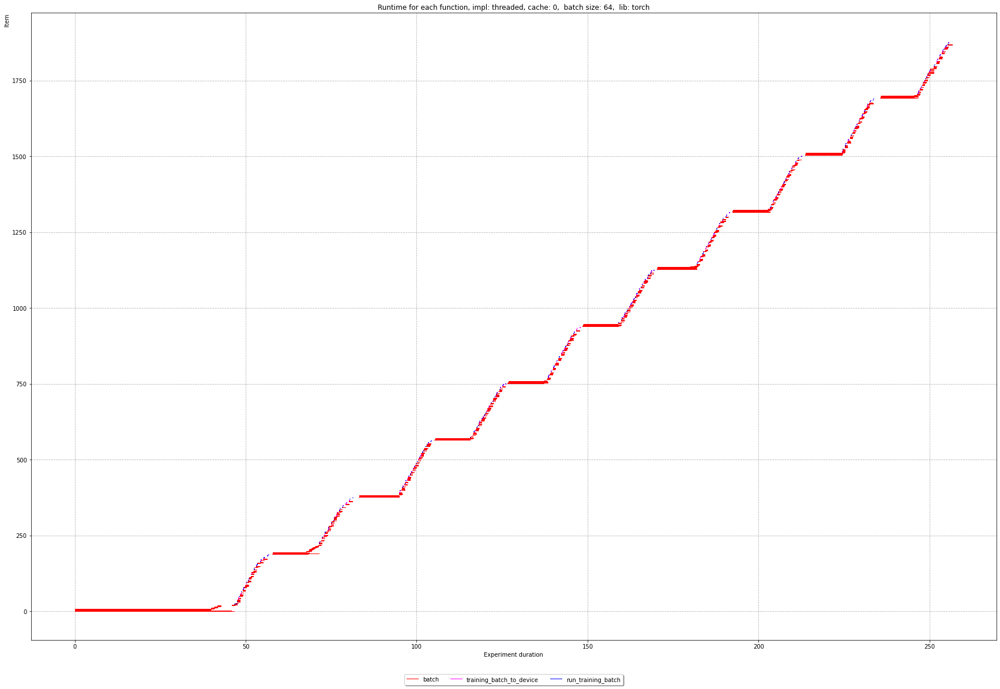

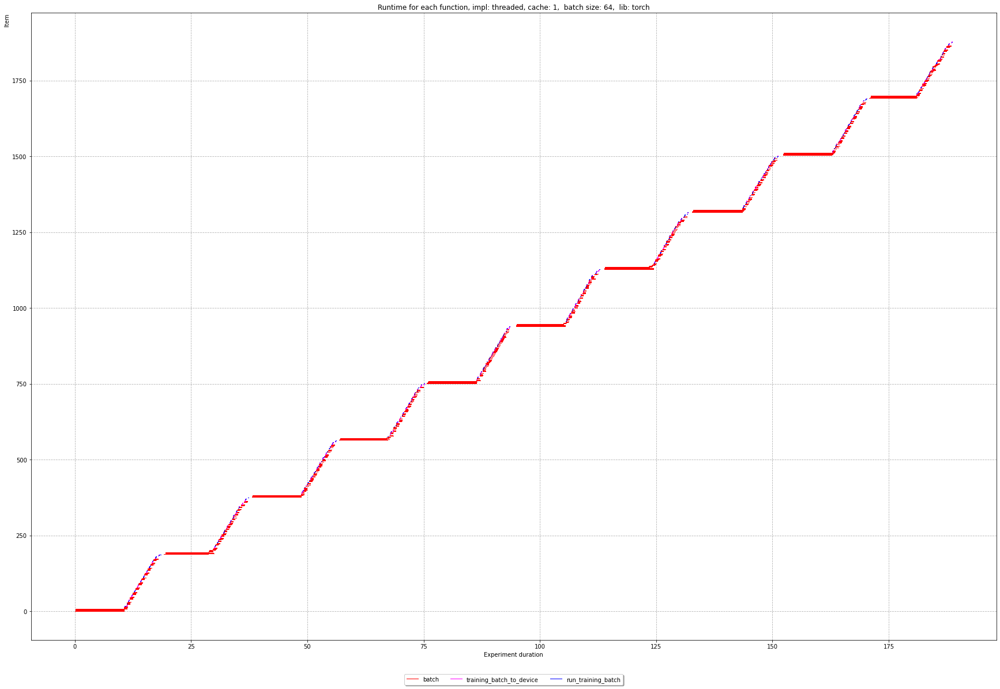

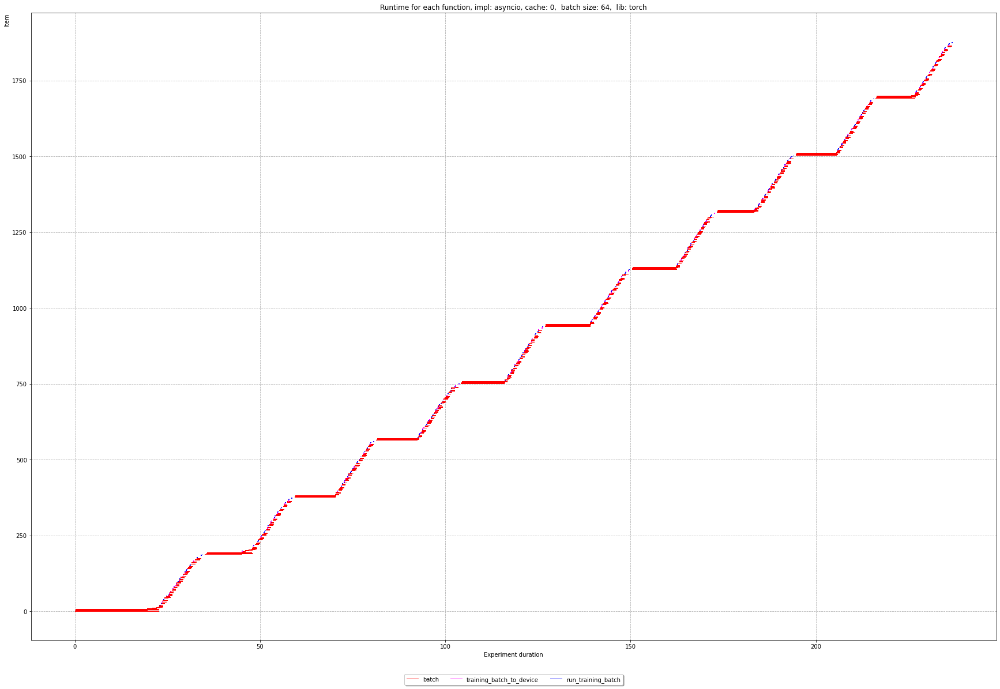

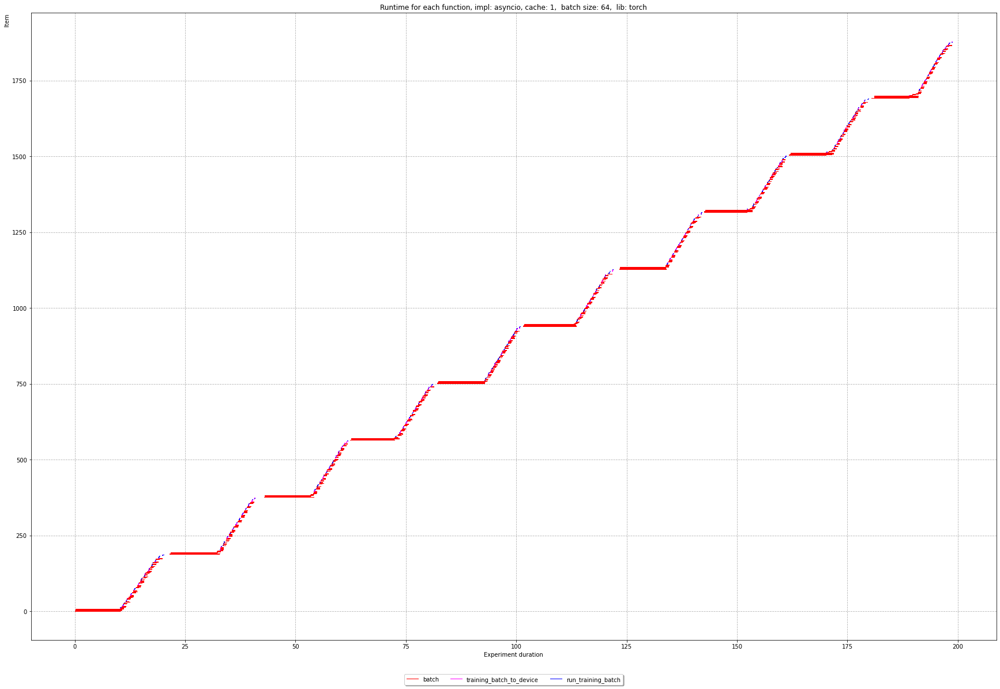

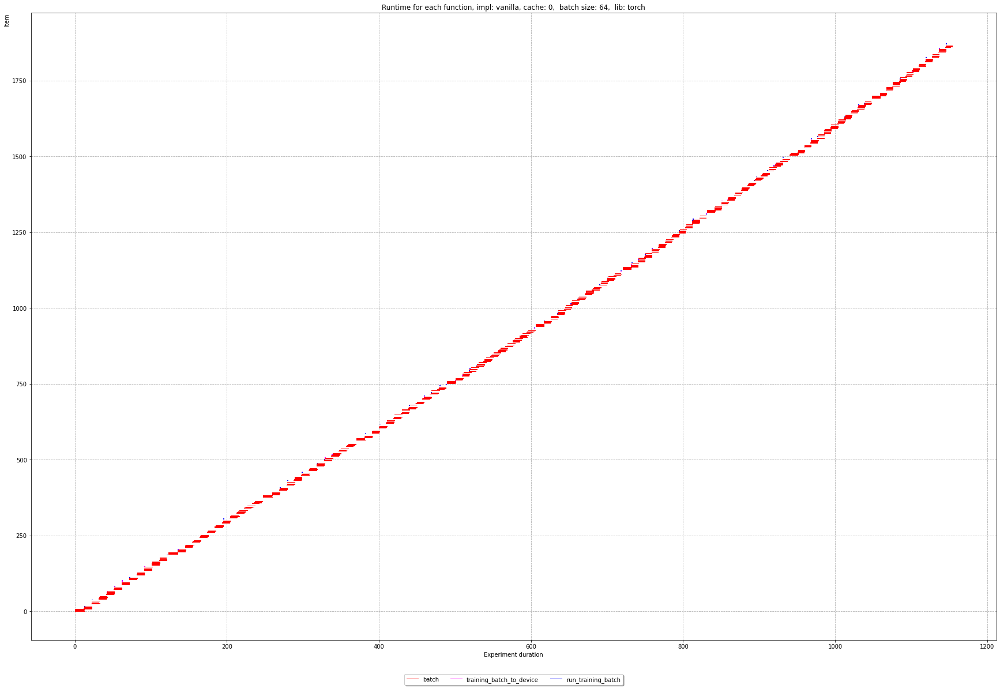

...

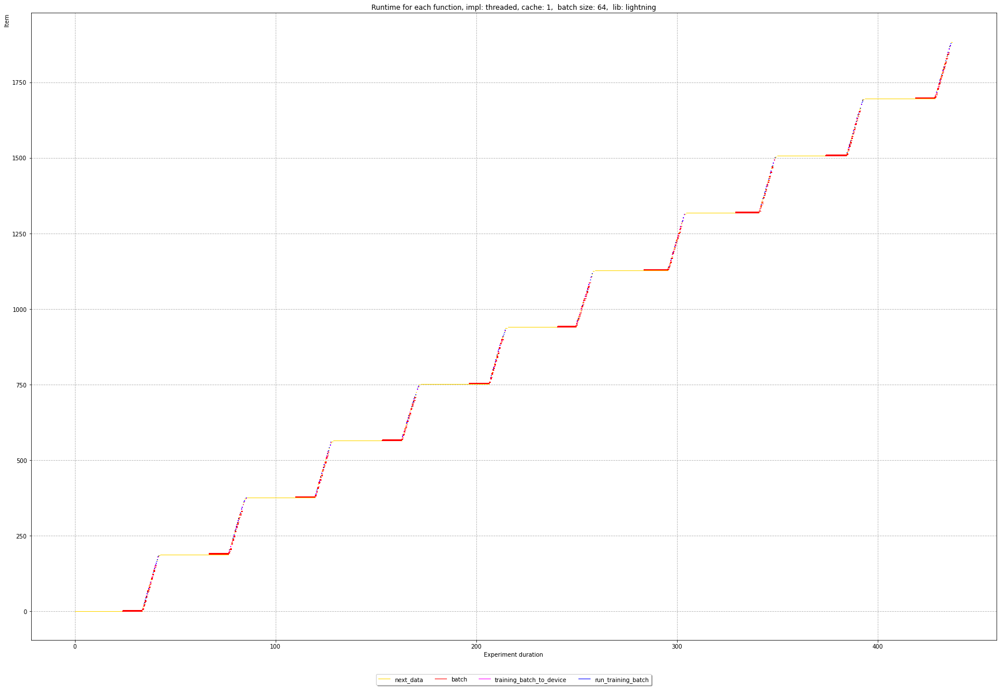

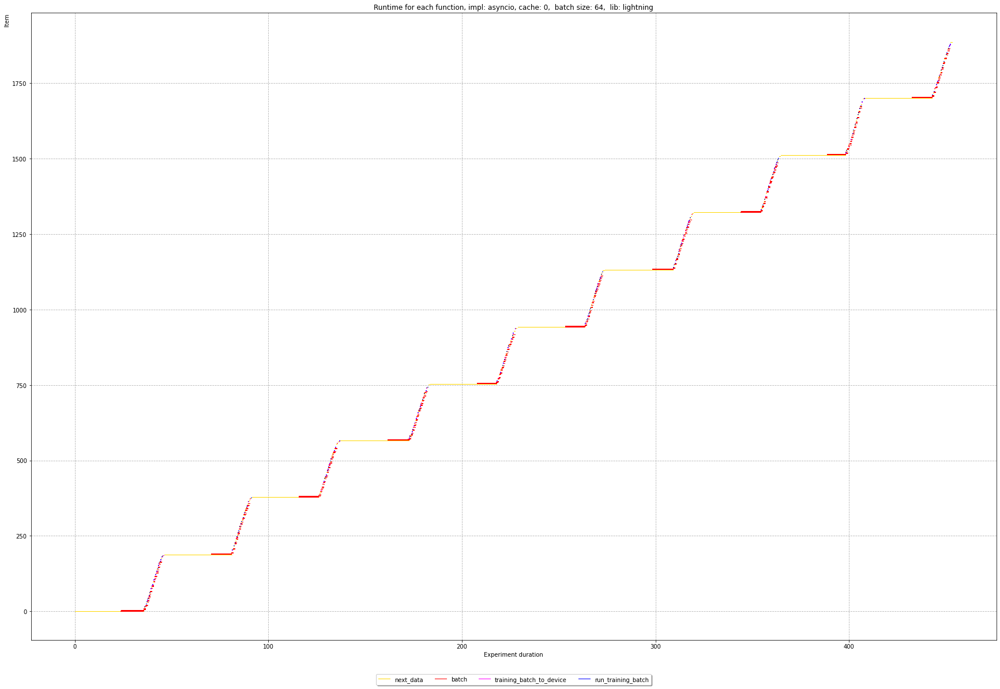

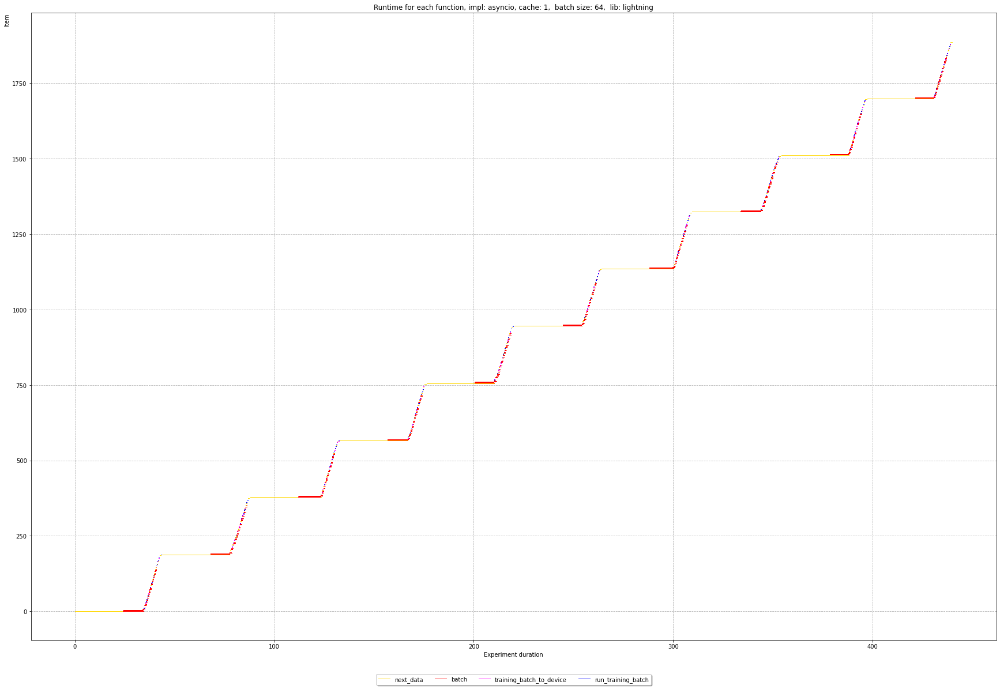

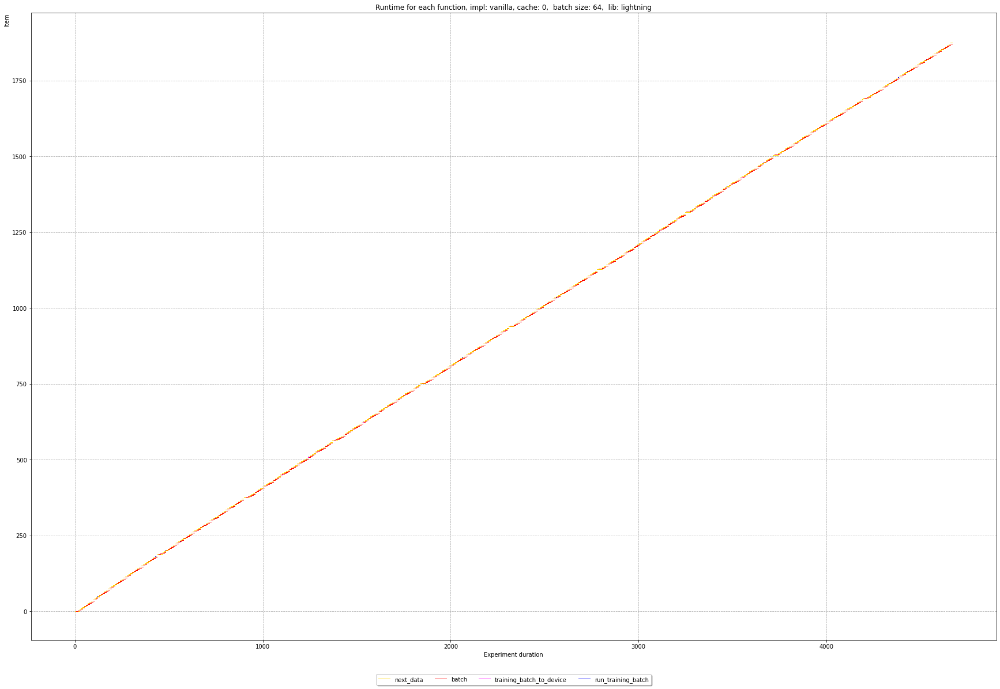

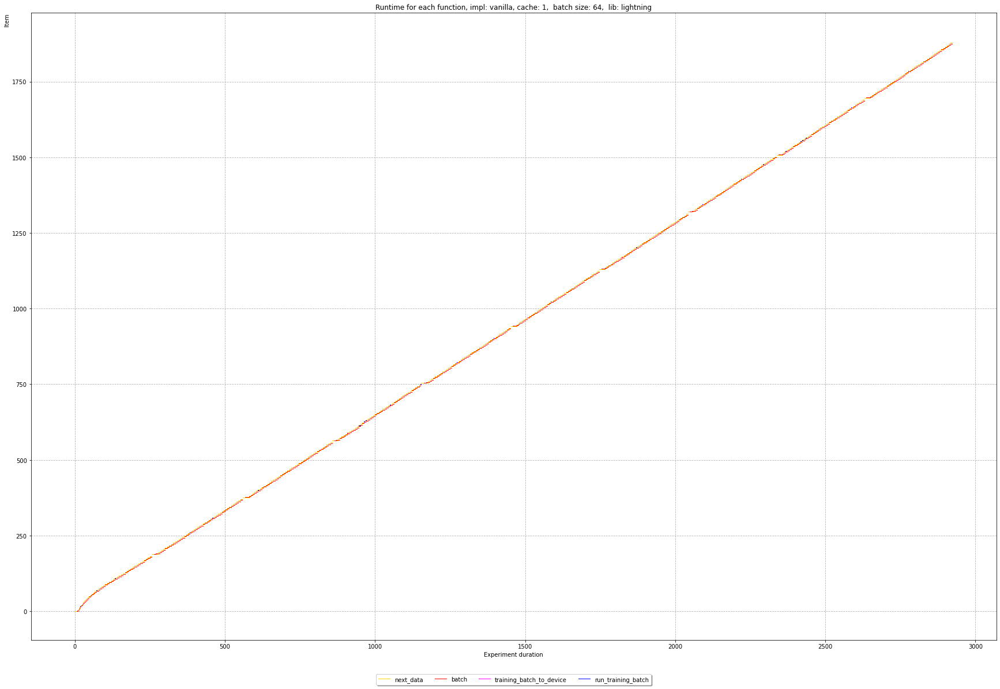

In [11]:
for implementation in ["torch", "lightning"]:
    for run in unique_runs_s3:
        if implementation in run:
            df = df_dataloader_s3[(df_dataloader_s3["run"]==run)]
            show_timelines(df, run, False, False, 1)

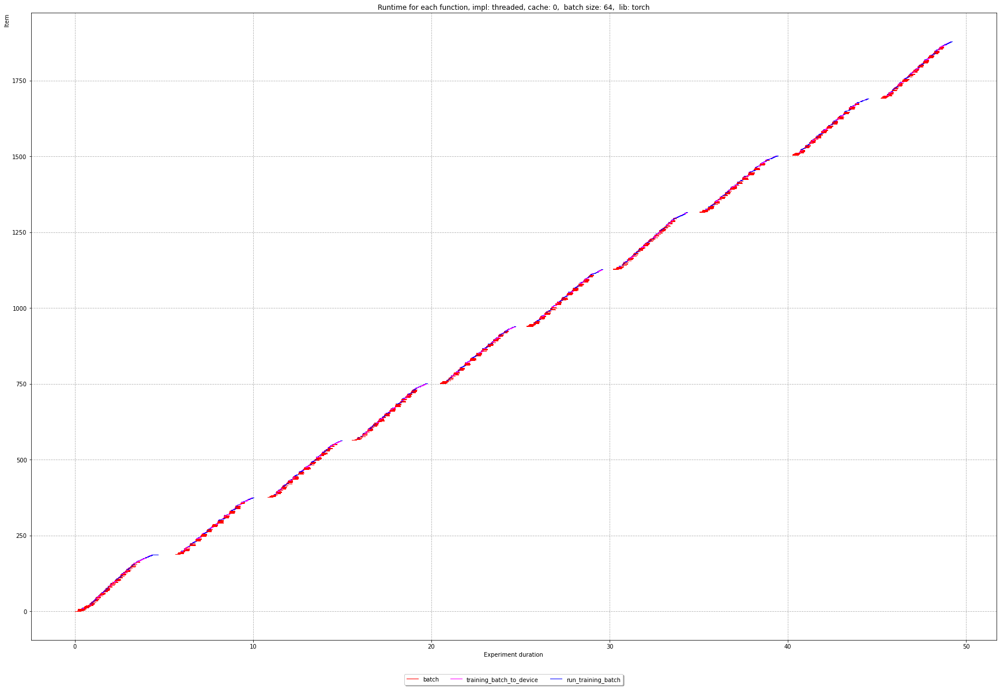

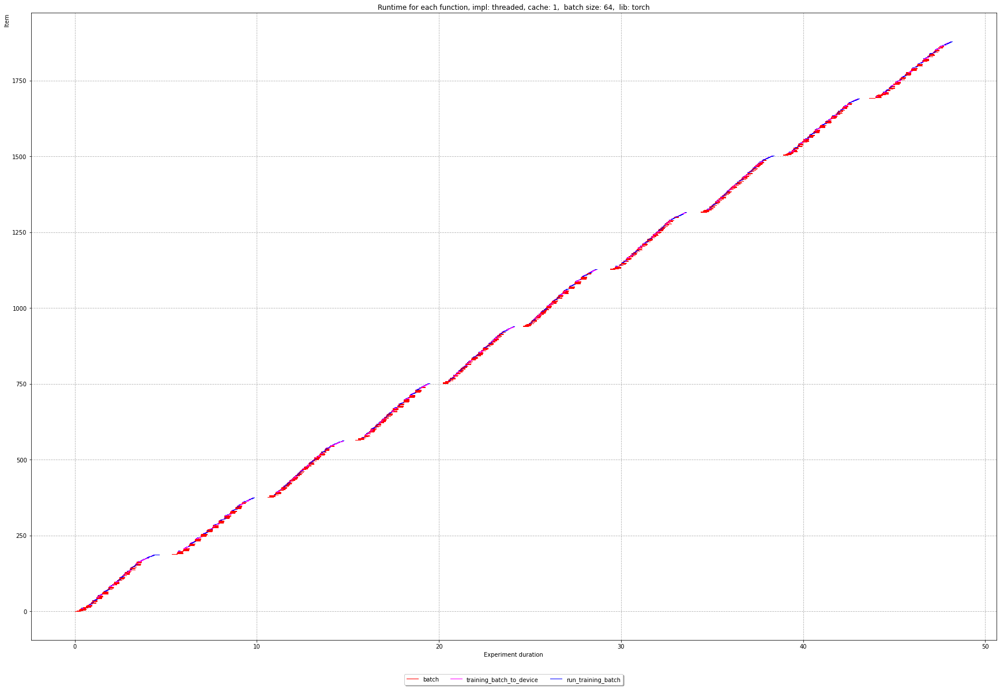

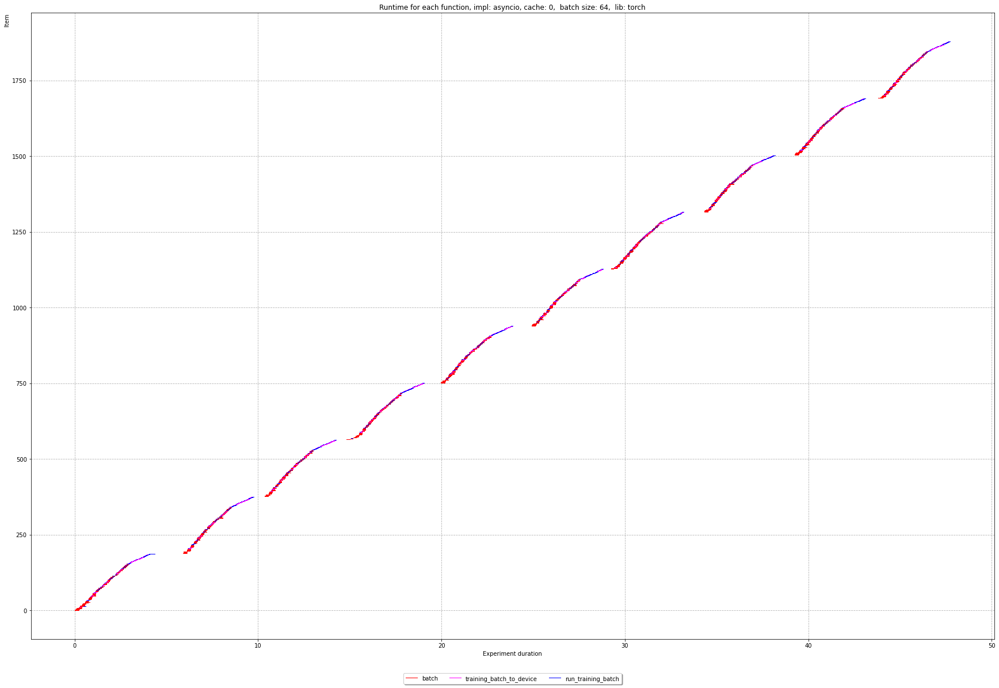

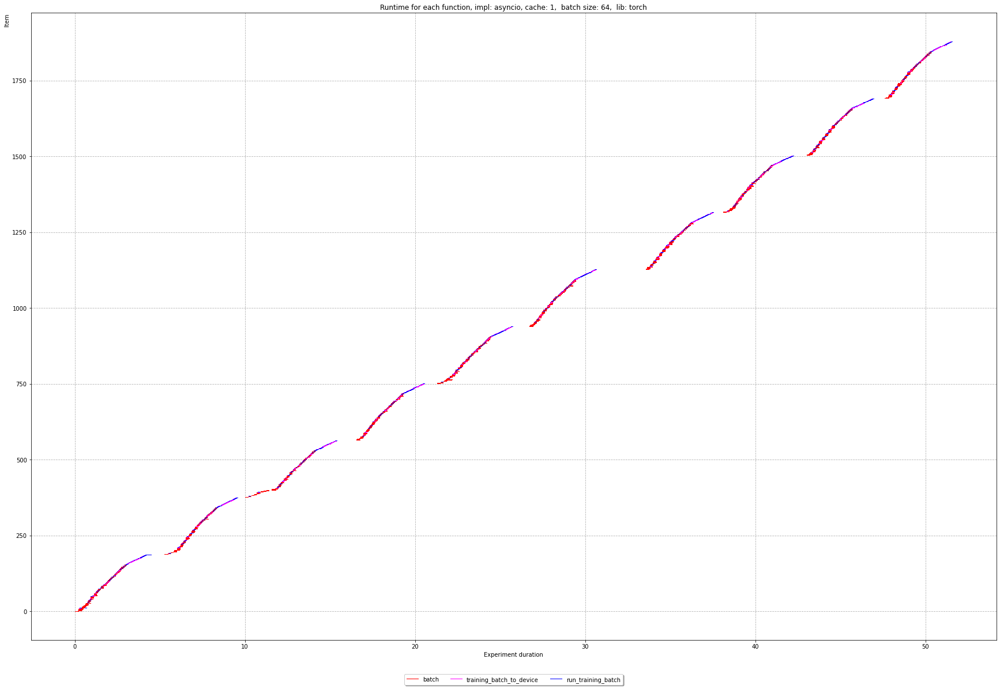

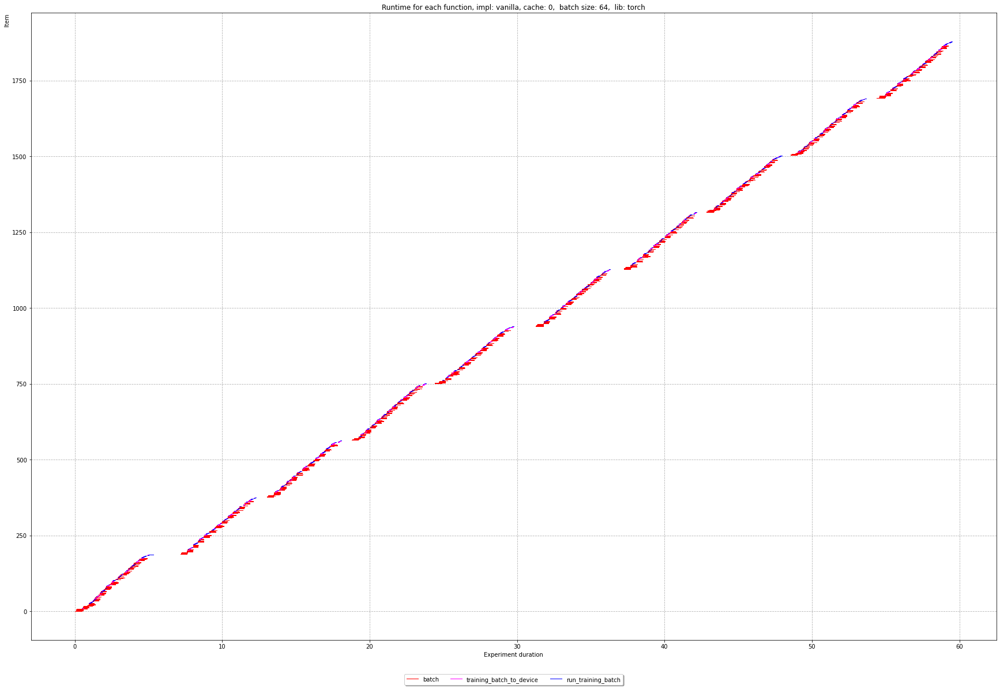

...

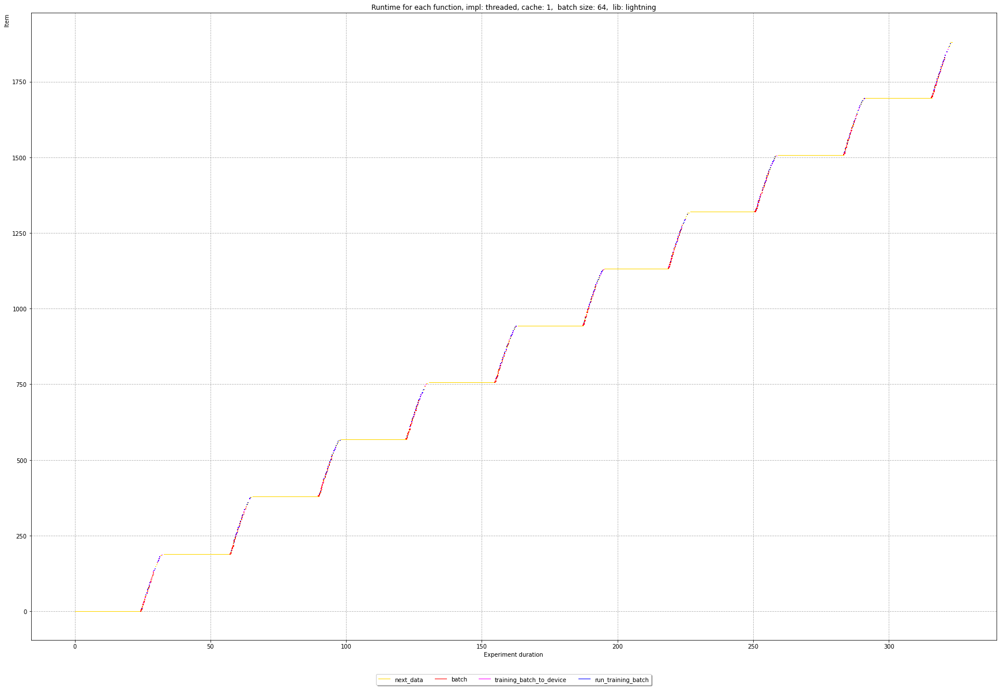

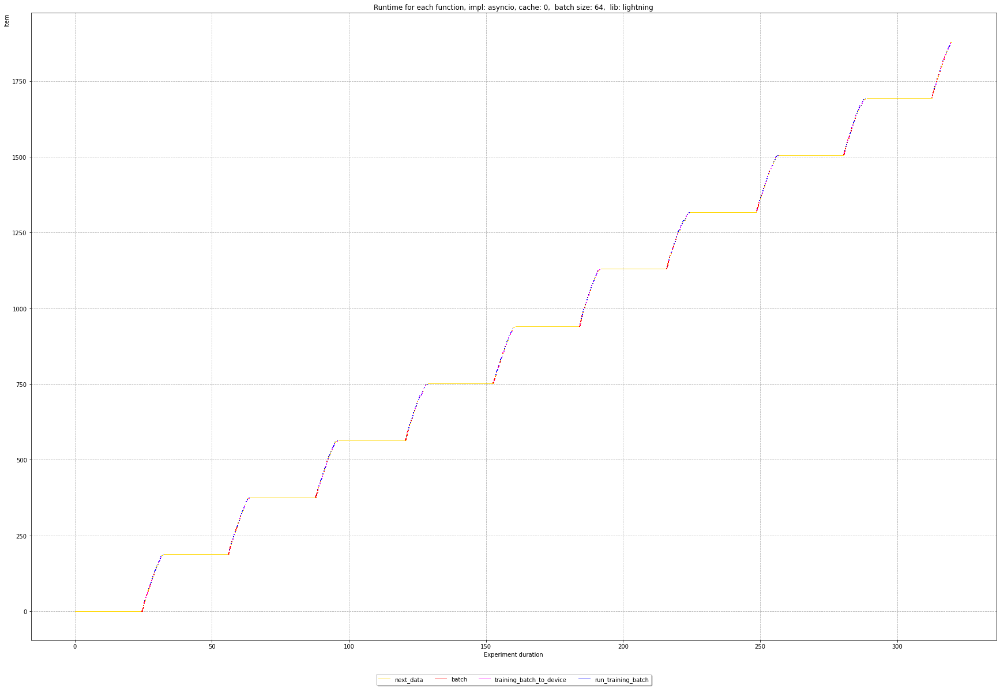

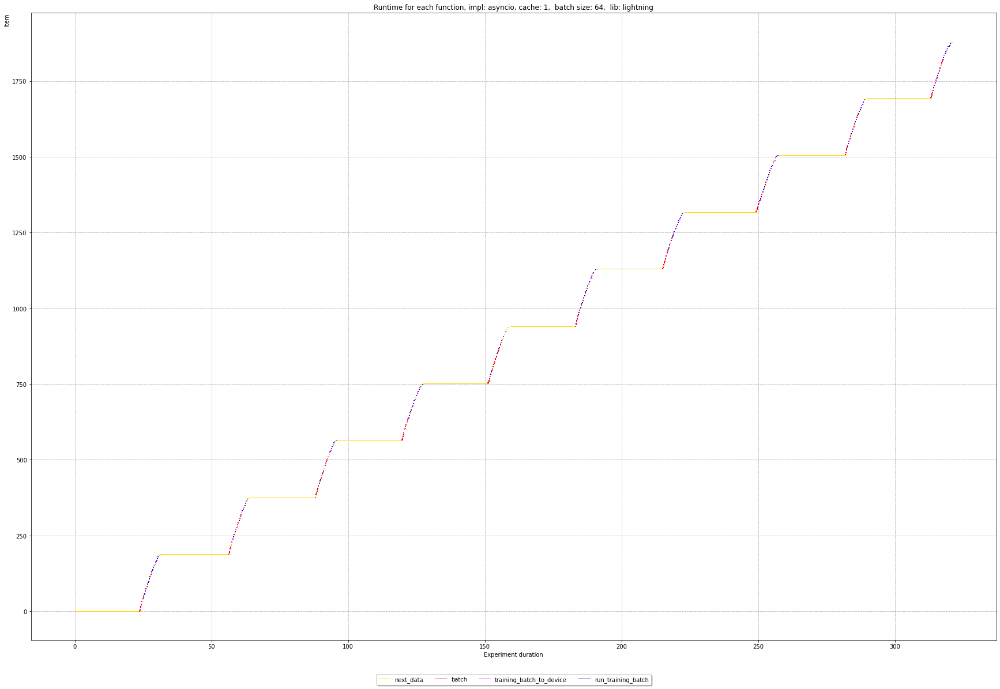

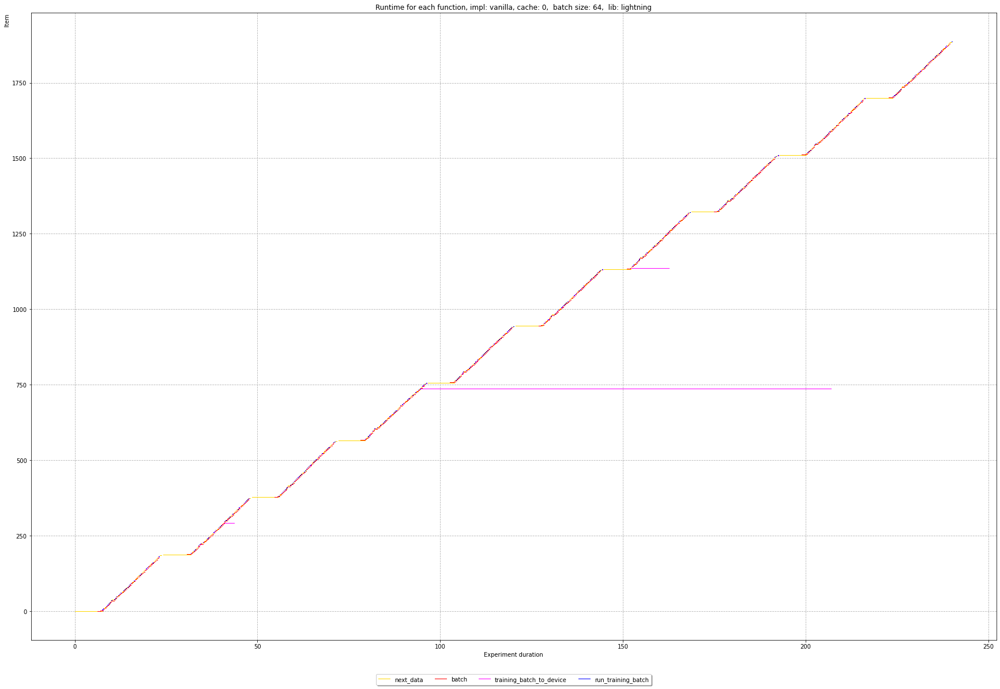

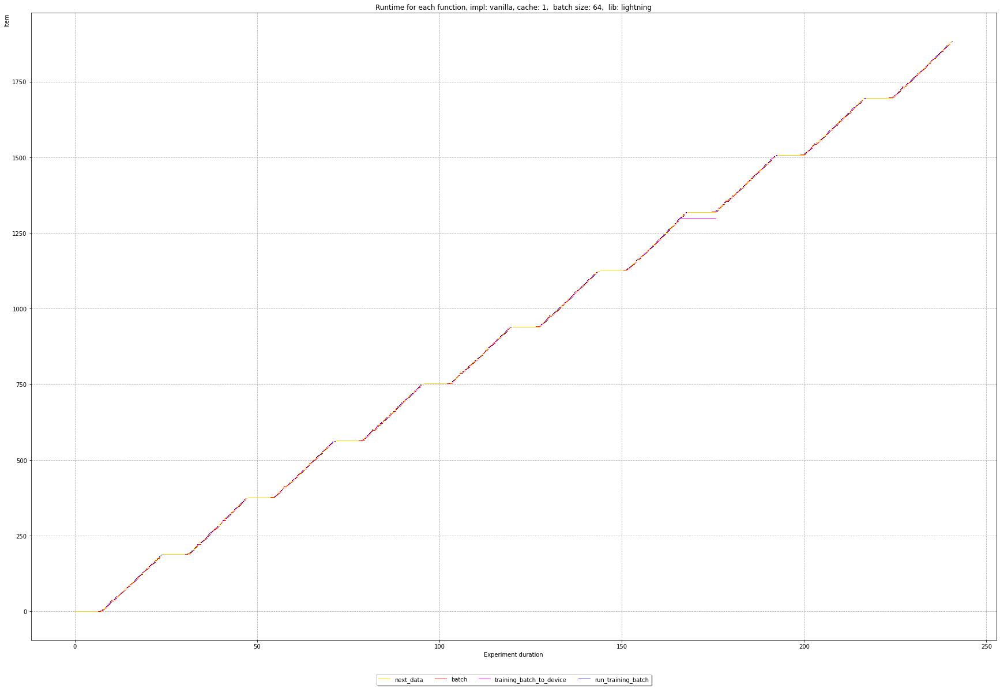

In [12]:
for implementation in ["torch", "lightning"]:
    for run in unique_runs_scratch:
        if implementation in run:
            df = df_dataloader_scratch[(df_dataloader_scratch["run"]==run)]
            show_timelines(df, run, False, False, 1)

In [13]:
def extract_gpuutil(output_base_folder: Path, folder_filter: str = "**", filter_by_metadata: Dict[str, List[str]] = None,
):
    files = list(output_base_folder.rglob(f"{folder_filter}/gpuutil-*.log"))
    data = []
    for working_file_path in tqdm.tqdm(files, total=len(files)):
        results = parse_results_log(working_file_path)
        if len(results) == 0:
            continue
        header = []
        header.append("timestamp")
        for i in results[0]["gpu_data"]:
            header.append(f"gpu_util_{i}")
            header.append(f"mem_util_{i}")
        header.append("run")
        lines = []
        for result in results:
            line = []
            line.append(result["timestamp"])
            for item in result["gpu_data"]:
                line.append(result["gpu_data"][item]["gpu_util"])
                line.append(result["gpu_data"][item]["mem_util"])
            line.append(working_file_path.parent.name)
            lines.append(line)
        results = pd.DataFrame.from_records(lines)
        data.append(results)
    df = pd.concat(data)
    df.columns = header
    df.groupby
    df.sort_values(["timestamp"], ascending=True)
    return df

In [14]:
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:04<00:00, 100.73it/s]


In [15]:
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 432/432 [00:02<00:00, 155.00it/s]


In [16]:
unique_runs_s3 = np.unique(df_dataloader_s3["run"])

In [17]:
unique_runs_scratch = np.unique(df_dataloader_scratch["run"])

In [18]:
print(unique_runs_s3, unique_runs_scratch)

['20211118f115917_benchmark_e2e_torch_s3_64_4_16_0_threaded_sync'
 '20211118f120344_benchmark_e2e_lightning_s3_64_4_16_0_threaded_sync'
 '20211118f121129_benchmark_e2e_torch_s3_64_4_16_1_threaded_sync'
 '20211118f121446_benchmark_e2e_lightning_s3_64_4_16_1_threaded_sync'
 '20211118f123520_benchmark_e2e_torch_s3_64_4_16_0_asyncio_sync'
 '20211118f123925_benchmark_e2e_lightning_s3_64_4_16_0_asyncio_sync'
 '20211118f124710_benchmark_e2e_torch_s3_64_4_16_1_asyncio_sync'
 '20211118f125037_benchmark_e2e_lightning_s3_64_4_16_1_asyncio_sync'
 '20211118f131109_benchmark_e2e_torch_s3_64_4_16_0_vanilla_sync'
 '20211118f133101_benchmark_e2e_lightning_s3_64_4_16_0_vanilla_sync'
 '20211118f144904_benchmark_e2e_torch_s3_64_4_16_1_vanilla_sync'
 '20211118f145346_benchmark_e2e_lightning_s3_64_4_16_1_vanilla_sync'] ['20211118f122214_benchmark_e2e_torch_scratch_64_4_16_0_threaded_sync'
 '20211118f122313_benchmark_e2e_lightning_scratch_64_4_16_0_threaded_sync'
 '20211118f122850_benchmark_e2e_torch_scratch

In [19]:
def show_timelines_with_gpu(df, gpu_util, run, flat=False, show_gpu=False, zoom=False, zoom_epochs = 1):
    fig, ax = plt.subplots(figsize=(30, 25))
    # fig, ax = plt.subplots()
    plt.rcParams.update({'font.size': 18})
    data = defaultdict(list)
    start = min(df["start_time_x"]) 
    end = max(df["end_time_y"]) 
    gpu_start = min(gpu_util["timestamp"])
    gpu_end = max(gpu_util["timestamp"])
    
    total_runtime = (end - start)
    number_of_epochs = 20
    
    if zoom:
        df = df[df["start_time_x"] < start+((total_runtime / number_of_epochs) * zoom_epochs)]
        gpu_util = gpu_util[gpu_util["timestamp"] < gpu_start+((total_runtime / number_of_epochs) * zoom_epochs)]
    
    lane = 0
    for index, row in df.sort_values(["start_time_x"], ascending=True).iterrows():
        duration = row["end_time_y"] - row["start_time_x"] 
        x1 = row["start_time_x"] - start 
        if duration < 0.15:
            duration = 0.2
        x2 = x1 + duration
        if not flat:
            lane += 10
        else:
            lane = lanes[row["item_x"]]
        ax.plot([x1, x2], [lane, lane], color=colors[row["item_x"]], label=row["item_x"], linewidth=3)
    

    ax.set_xlabel("Experiment duration (S)", loc="right")
    ax.set_ylabel("Operation activity lane", loc="center")
    filename = run.split('_')

    
    ax.legend()
    ax.grid(linestyle='--', which="both")

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))

    # Put a legend below current axis
    ax.legend(by_label.values(), by_label.keys(), 
              loc='upper center', bbox_to_anchor=(0.5, -0.05),
              fancybox=True, shadow=True, ncol=5)
    
    gpu_util_mean = 0
    gpu_util_mean_no_zeros = 0
    
    if show_gpu:
        ax2 = ax.twinx() 
        ax2.set_ylabel('GPU/Memory utilization (green, maroon)')
        
        r'{\fontsize{50pt}{3em}\selectfont{}a}{\fontsize{20pt}{3em}\selectfont{}N'
        ax2.set_ylim([-3, 103])
        gpu_events = []
        for i in gpu_util["timestamp"]:
            gpu_events.append(i - start)
        ax2.plot(gpu_events, gpu_util["gpu_util_2"], color="cyan", linestyle="--", linewidth=2)
        ax2.plot(gpu_events, gpu_util["mem_util_2"], color="maroon", linestyle="--", linewidth=2)
        gpu_util_zeros = (len(gpu_util[gpu_util['gpu_util_2'] == 0]['gpu_util_2']) / len(gpu_util['gpu_util_2'])) * 100        
        gpu_util_mean_no_zeros = np.mean(gpu_util[gpu_util['gpu_util_2'] > 0]['gpu_util_2']) 
        mem_util_mean = np.mean(gpu_util['mem_util_2'])
        mem_util_mean_no_zeros = np.mean(gpu_util[gpu_util['mem_util_2'] > 0]['mem_util_2']) 
        ax2.plot(gpu_events, [gpu_util_mean_no_zeros]*len(gpu_events), label='GPU Util Mean', linewidth=2, color='cyan')
        ax2.plot(gpu_events, [mem_util_mean_no_zeros]*len(gpu_events), label='Mem Util Mean', linewidth=2, color='maroon')
        print(gpu_util_mean_no_zeros, mem_util_mean_no_zeros)
        
        
    ax.set_title(f"Total runtime per operation \n Implementation: {filename[9]},"
             #f" use cache: {filename[8]}, "
             f" batch size: {filename[5]}, "
             f" library: {filename[3]}, "
             f"\n GPU unused: {round(gpu_util_zeros, 2)} %, "
             f" mean GPU usage: {round(gpu_util_mean_no_zeros, 2)} %",
             loc='center')

    plt.show()
    return {"runtime": end-start, 
            "gpu_util_zero": gpu_util_zeros, 
            "gpu_util_mean_no_zeros": gpu_util_mean_no_zeros, 
            "mem_util_mean": mem_util_mean, 
            "mem_util_mean_no_zeros": mem_util_mean_no_zeros, 
            "implementation": filename[9],
            "library": filename[3]
           }

41.68055555555556 24.808823529411764


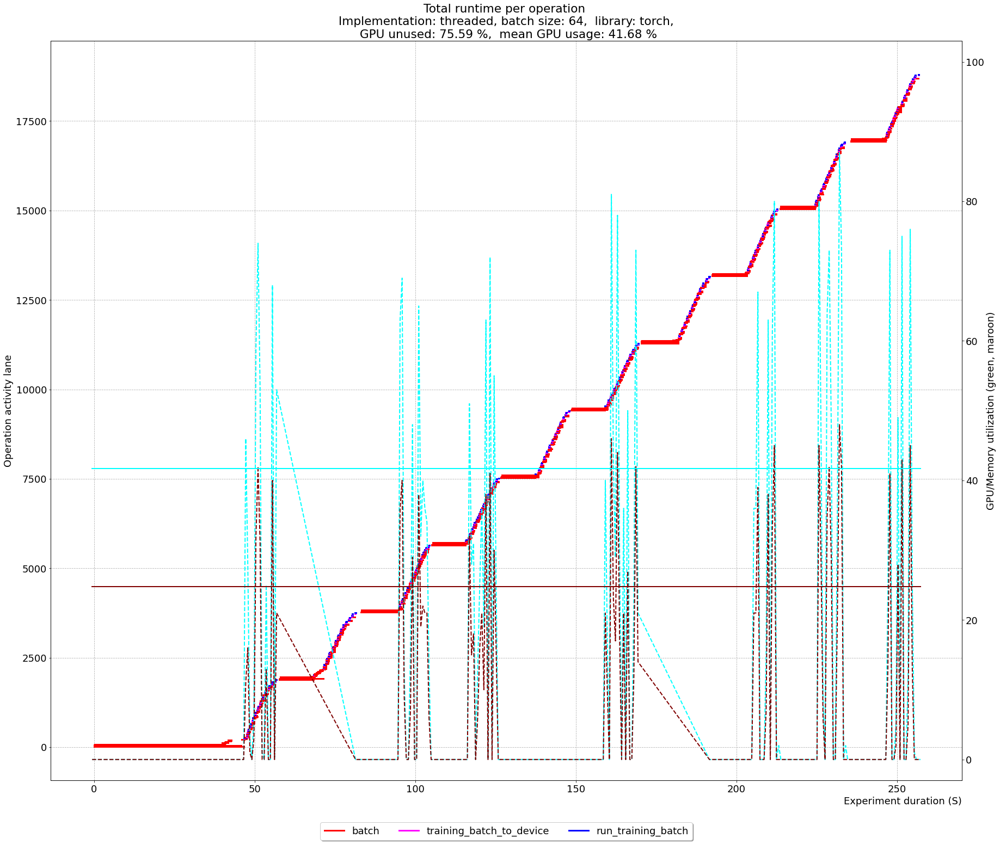

41.25352112676056 14.666666666666666


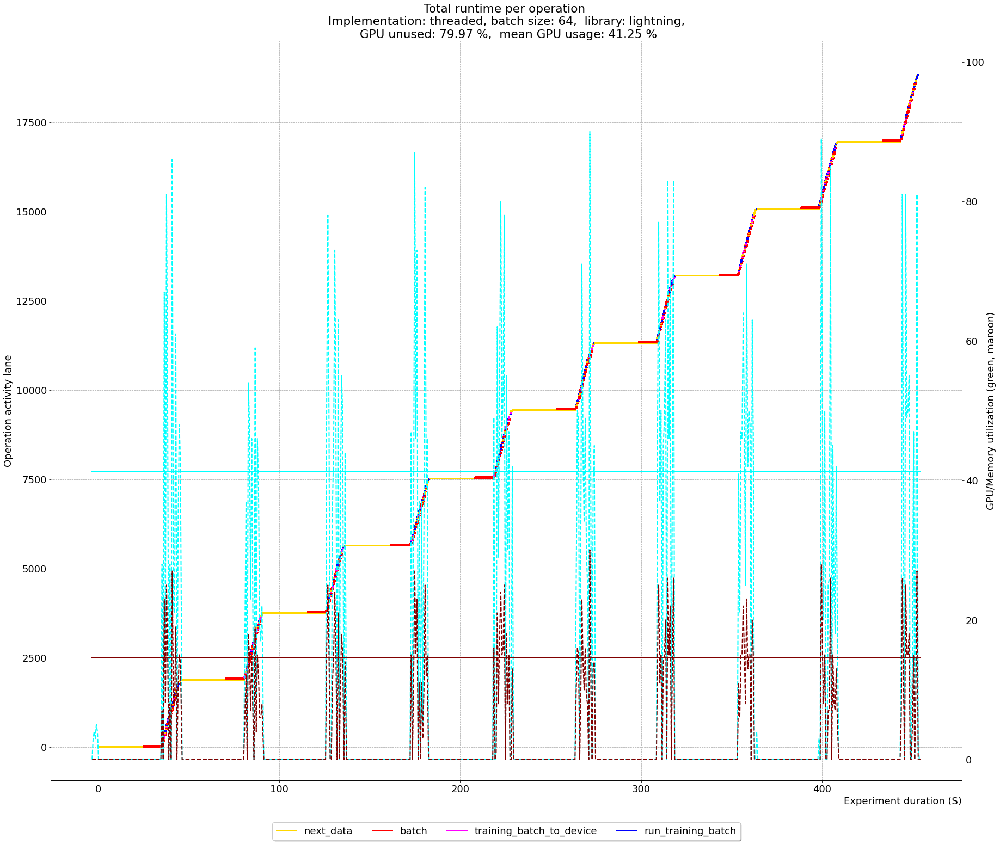

37.9277108433735 23.571428571428573


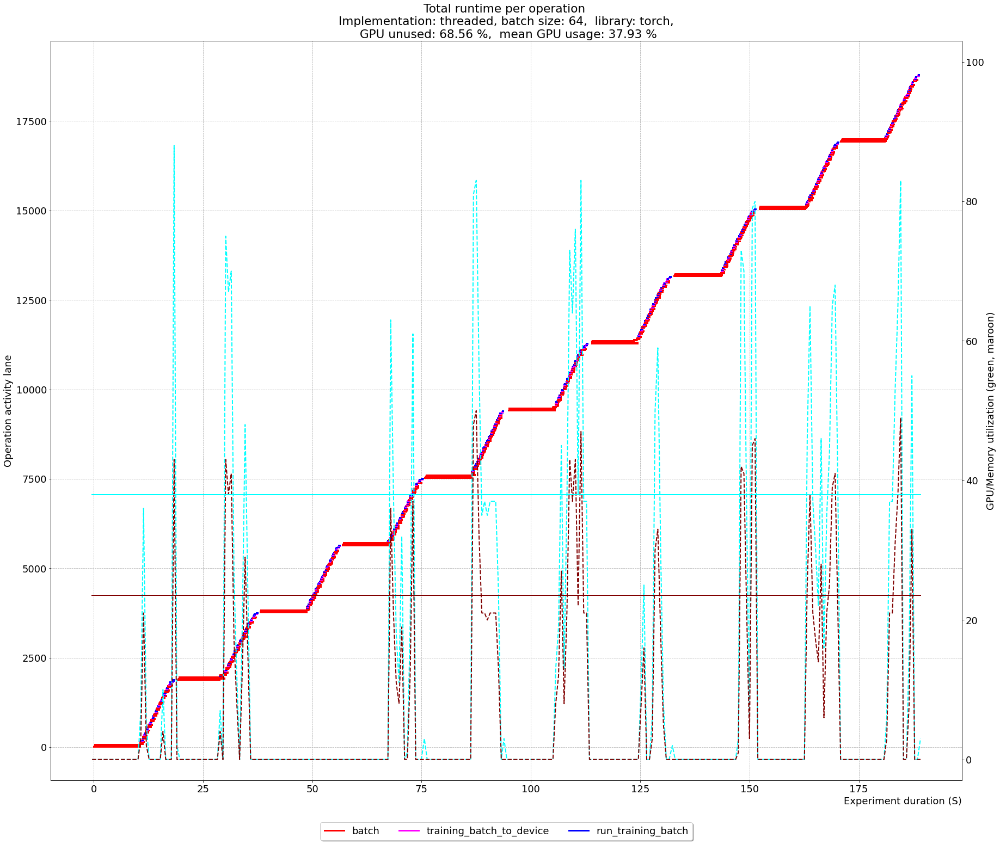

41.79710144927536 14.492063492063492


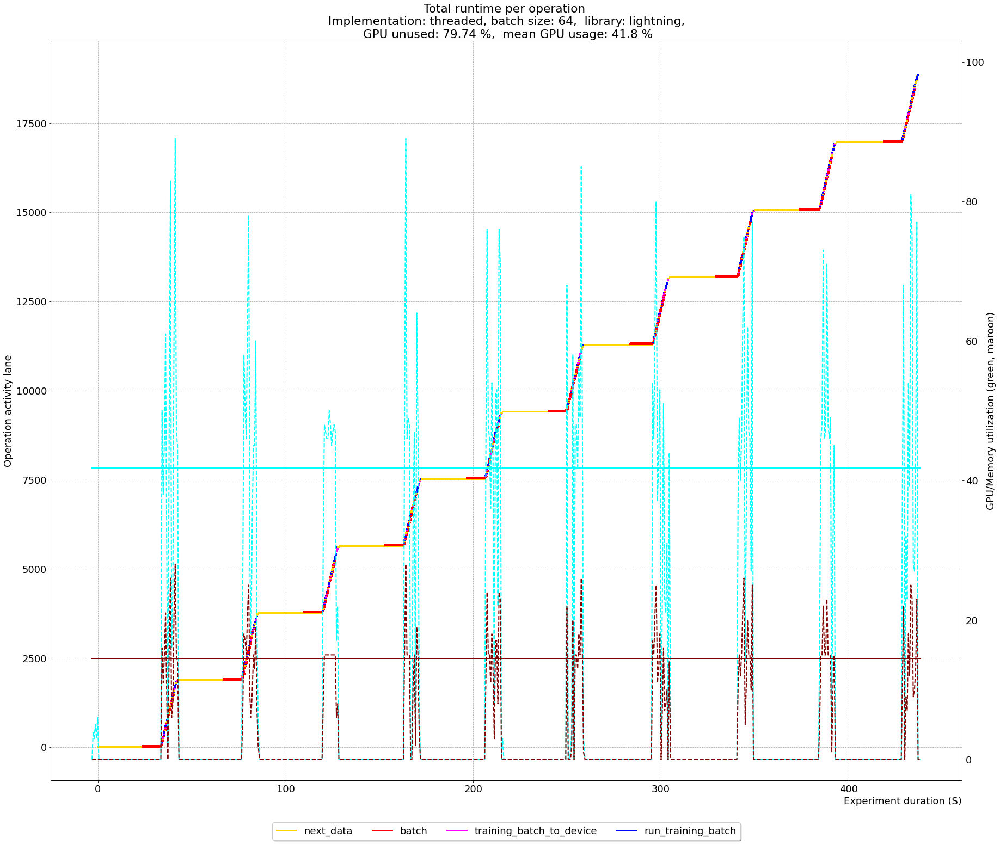

37.26829268292683 23.026666666666667


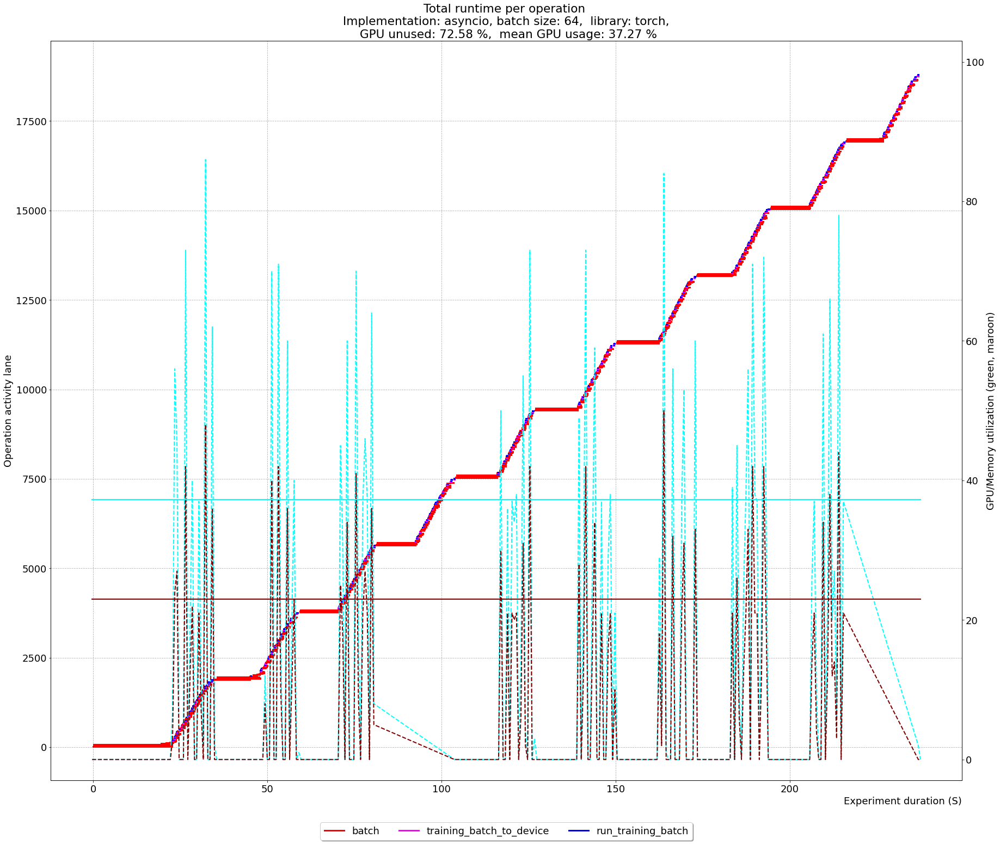

38.10884353741496 13.765625


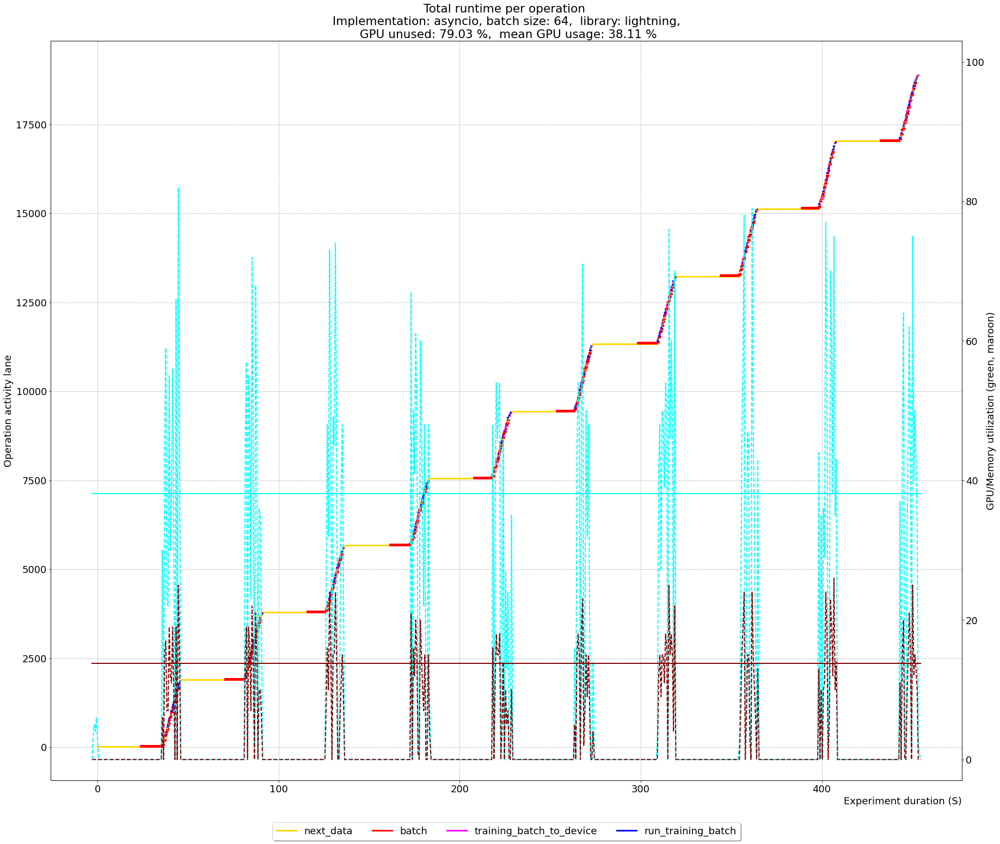

44.96103896103896 27.36231884057971


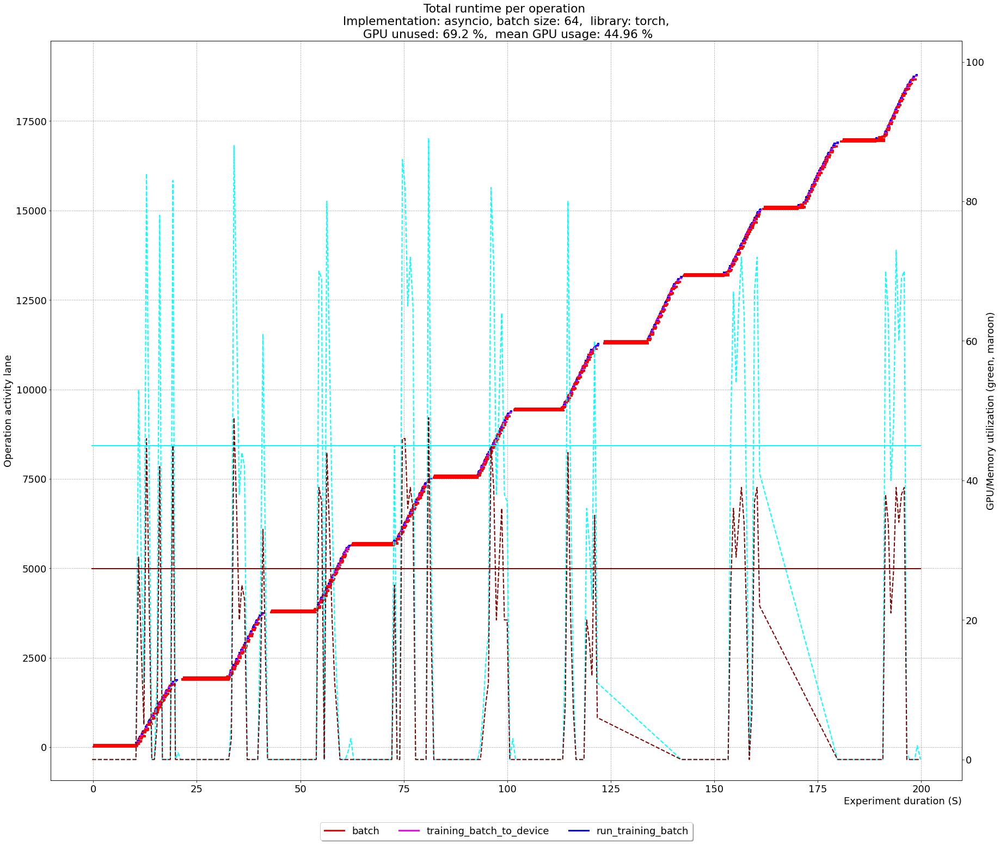

41.369565217391305 14.516129032258064


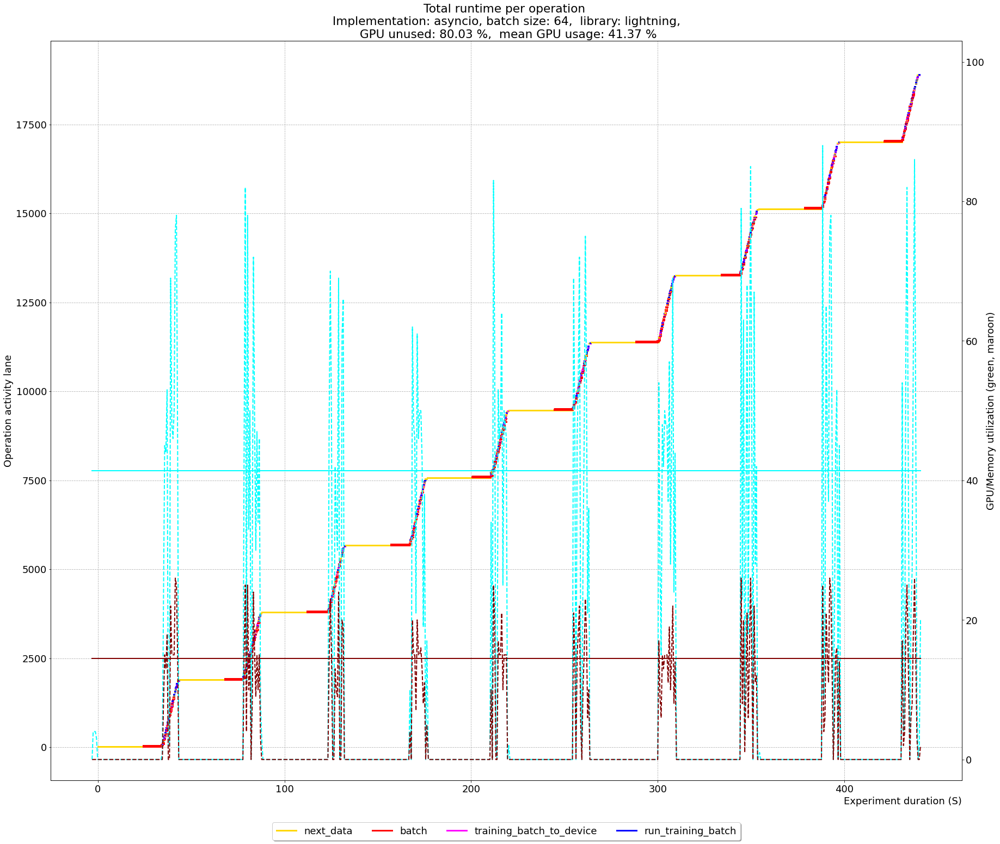

39.215053763440864 22.57471264367816


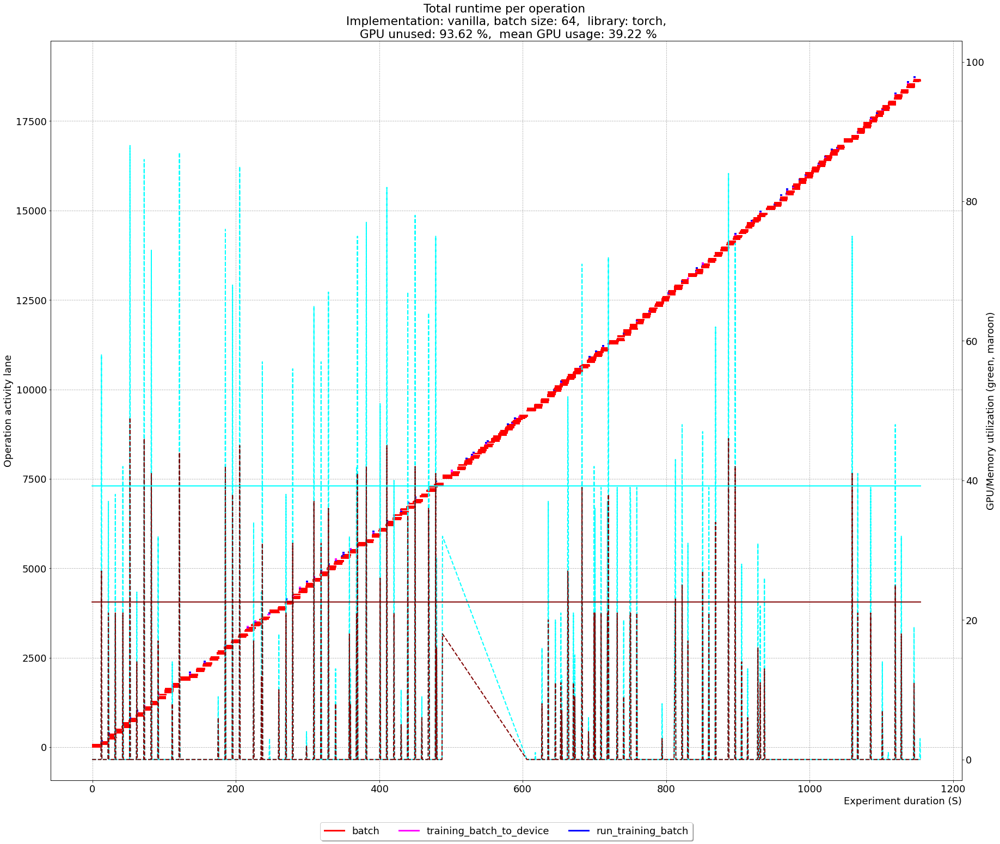

30.043715846994534 10.884615384615385


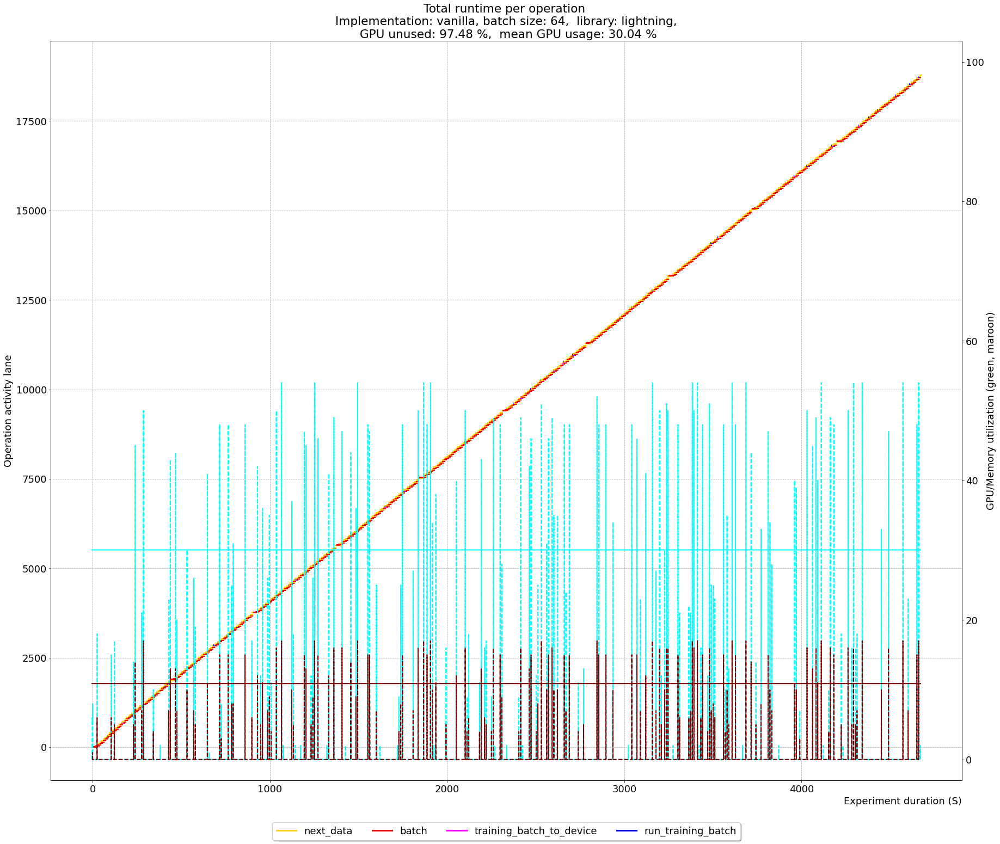

39.970873786407765 24.45744680851064


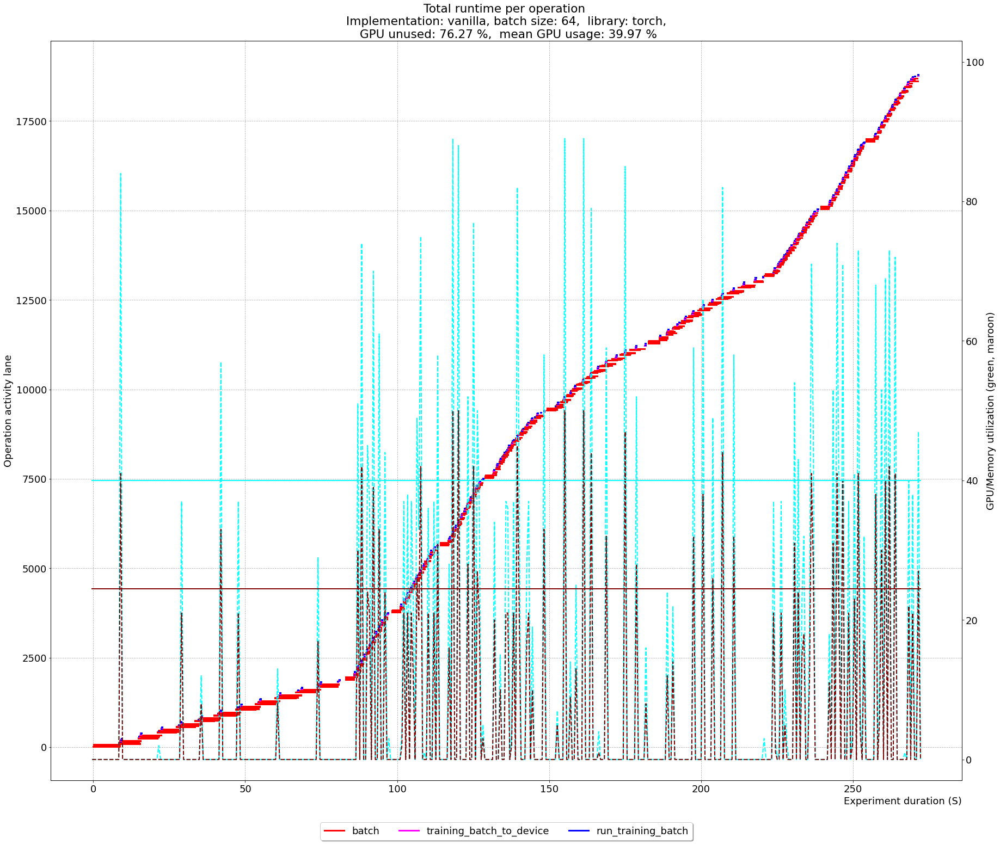

27.387254901960784 9.823863636363637


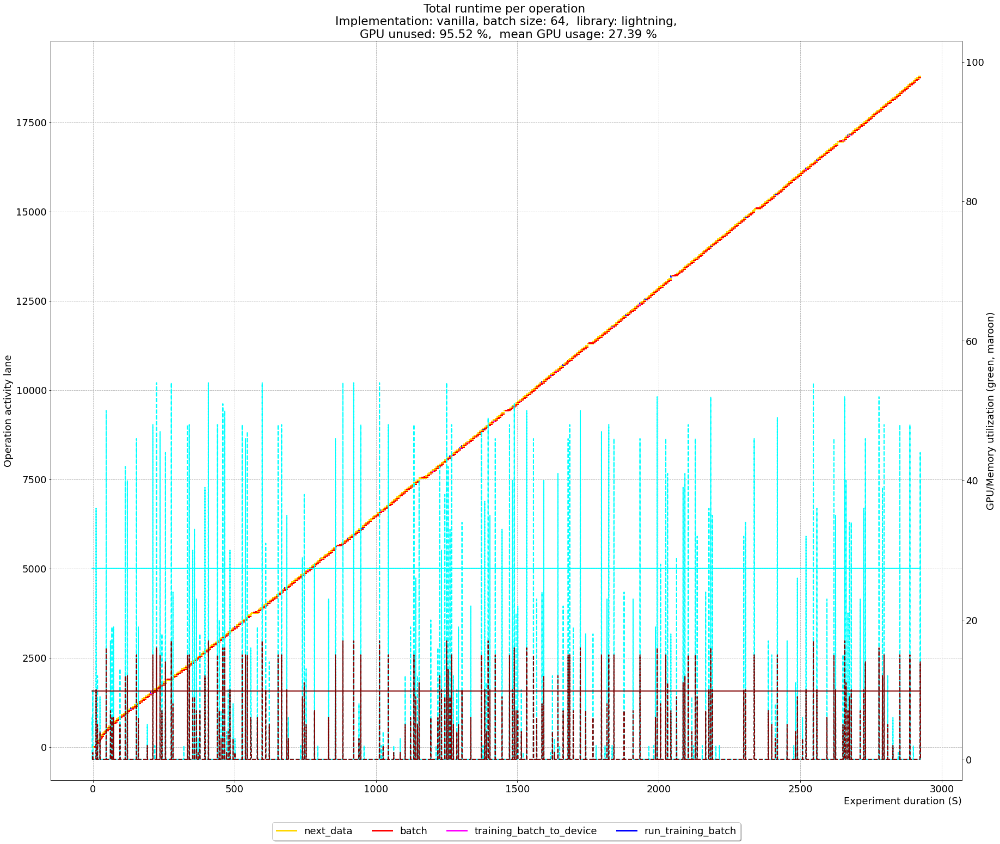

In [24]:
returns_s3 = []
for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    returns_s3.append(show_timelines_with_gpu(df, dfgpu, run, False, True, False, 2))

60.15384615384615 34.4


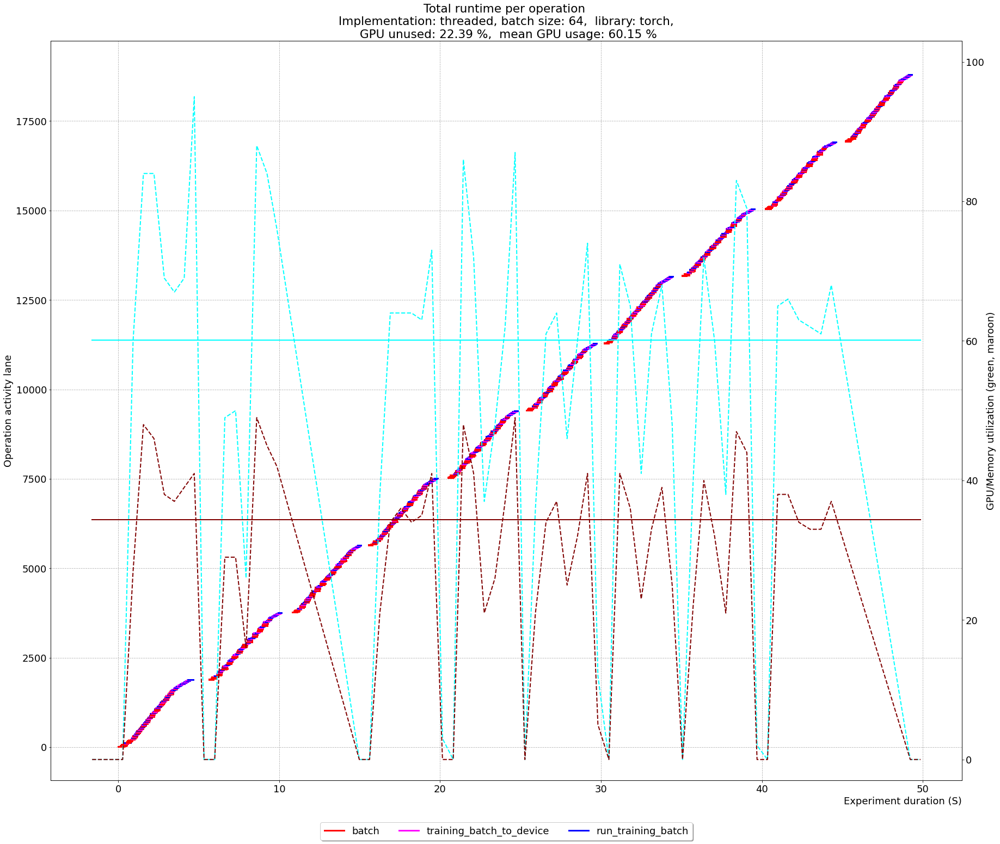

45.377049180327866 15.324561403508772


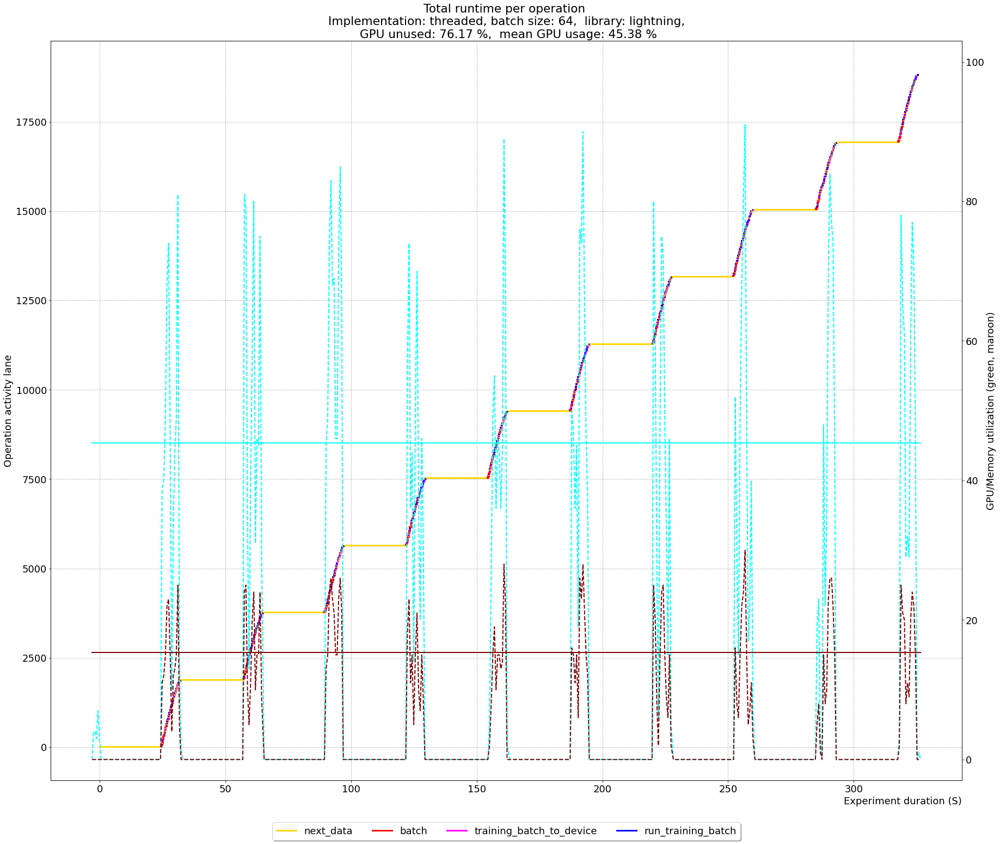

61.23913043478261 36.65909090909091


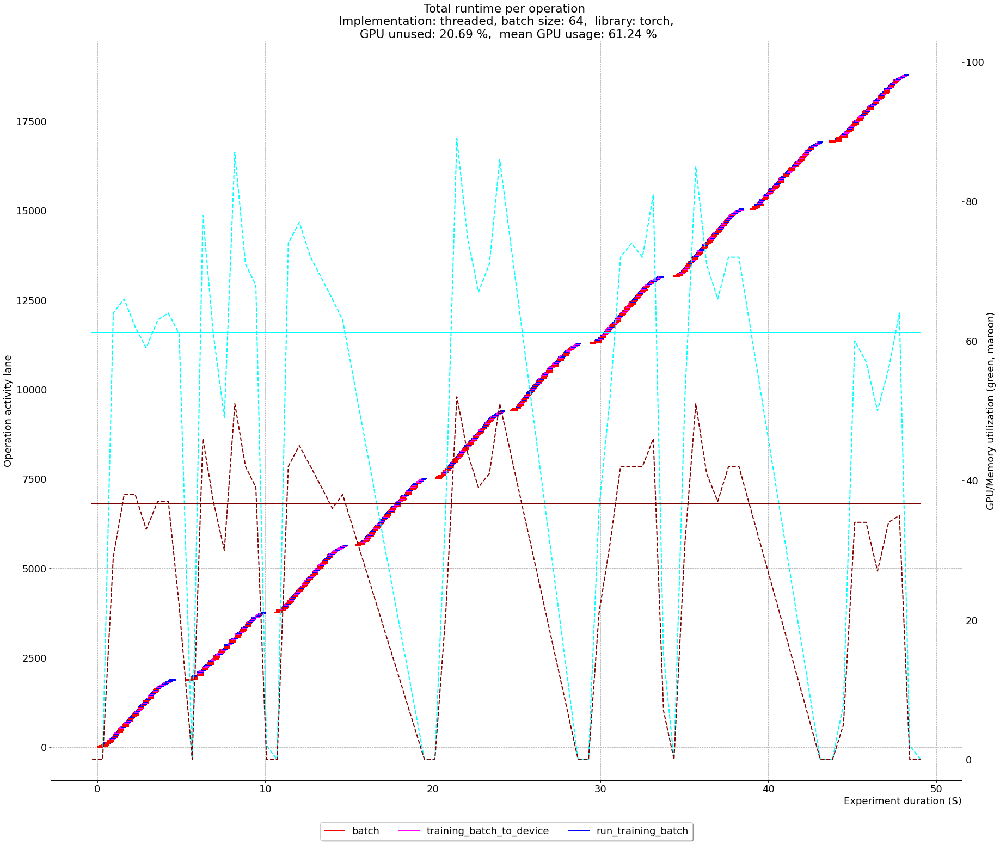

45.83471074380165 15.714285714285714


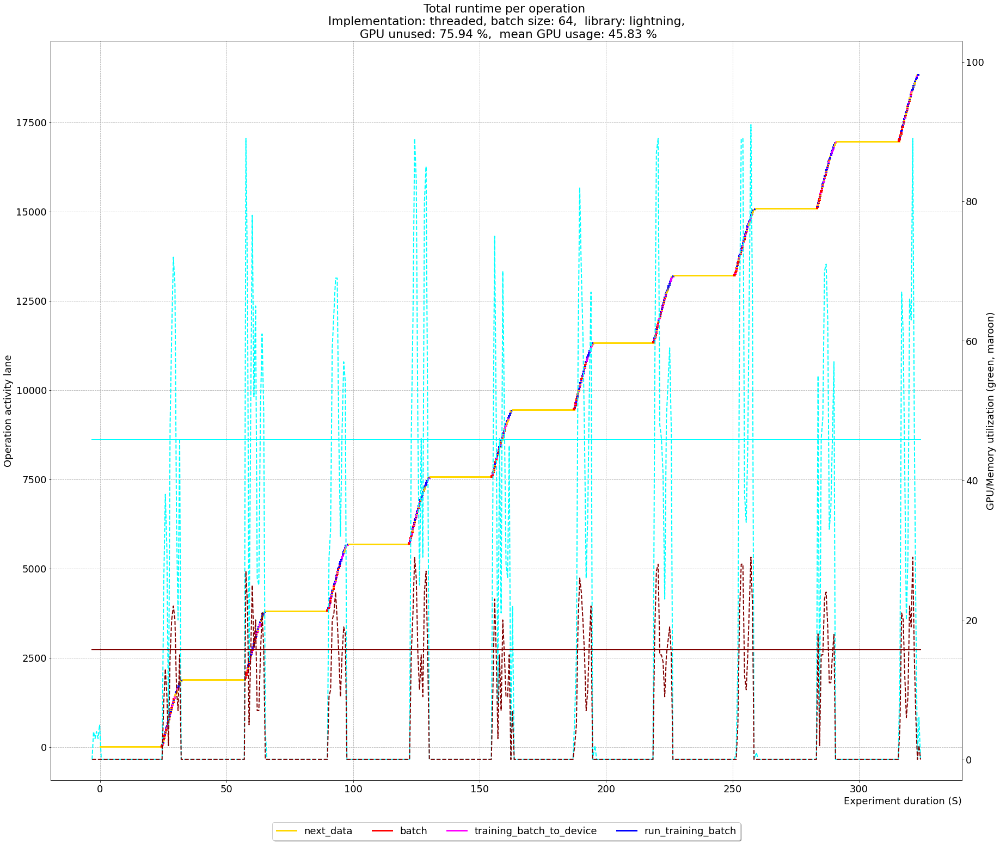

67.88524590163935 38.83050847457627


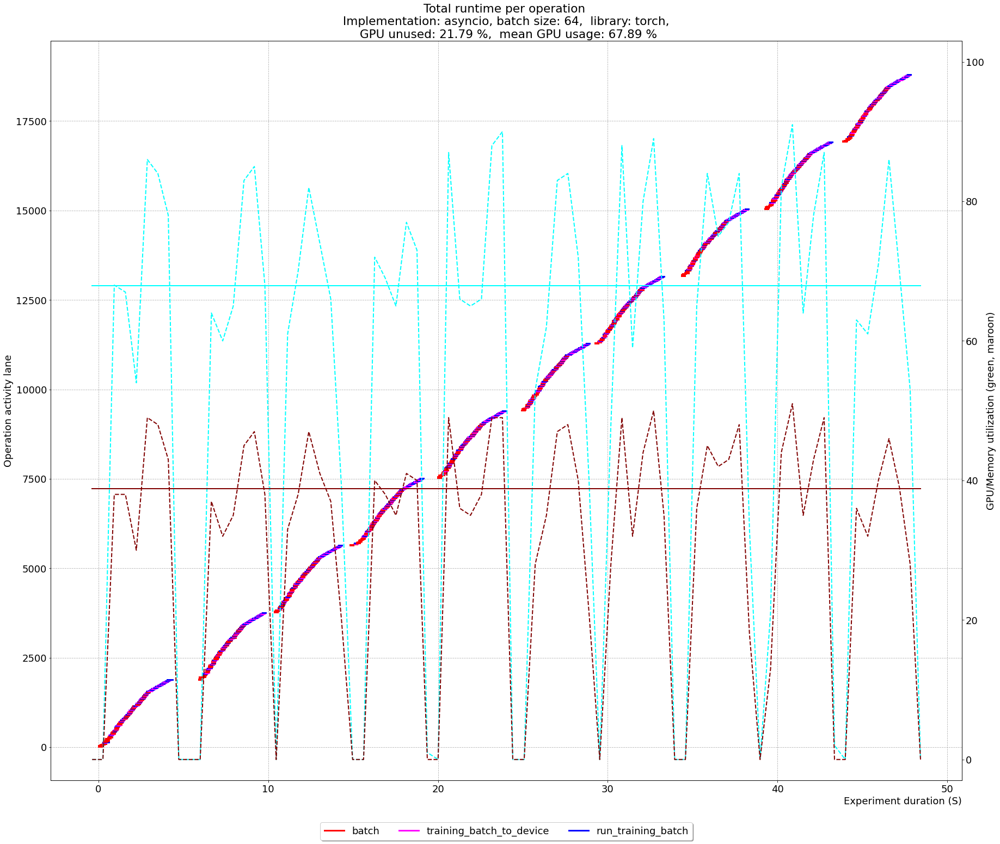

45.333333333333336 15.414414414414415


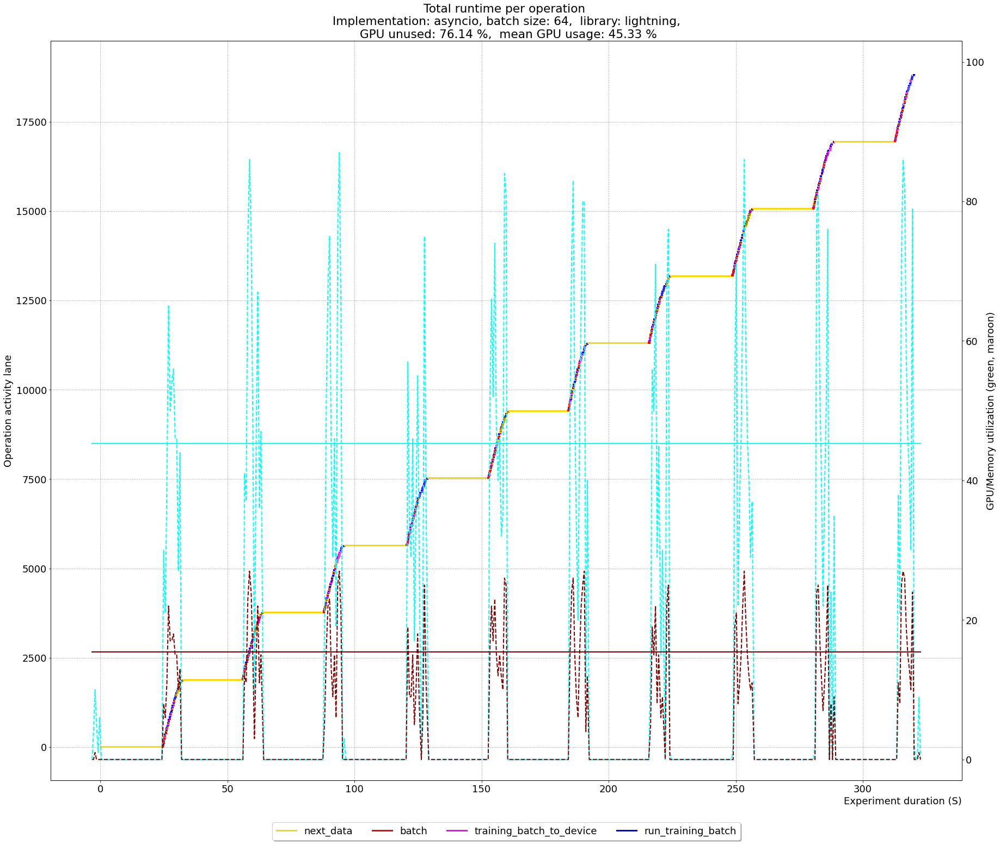

58.36764705882353 38.91525423728814


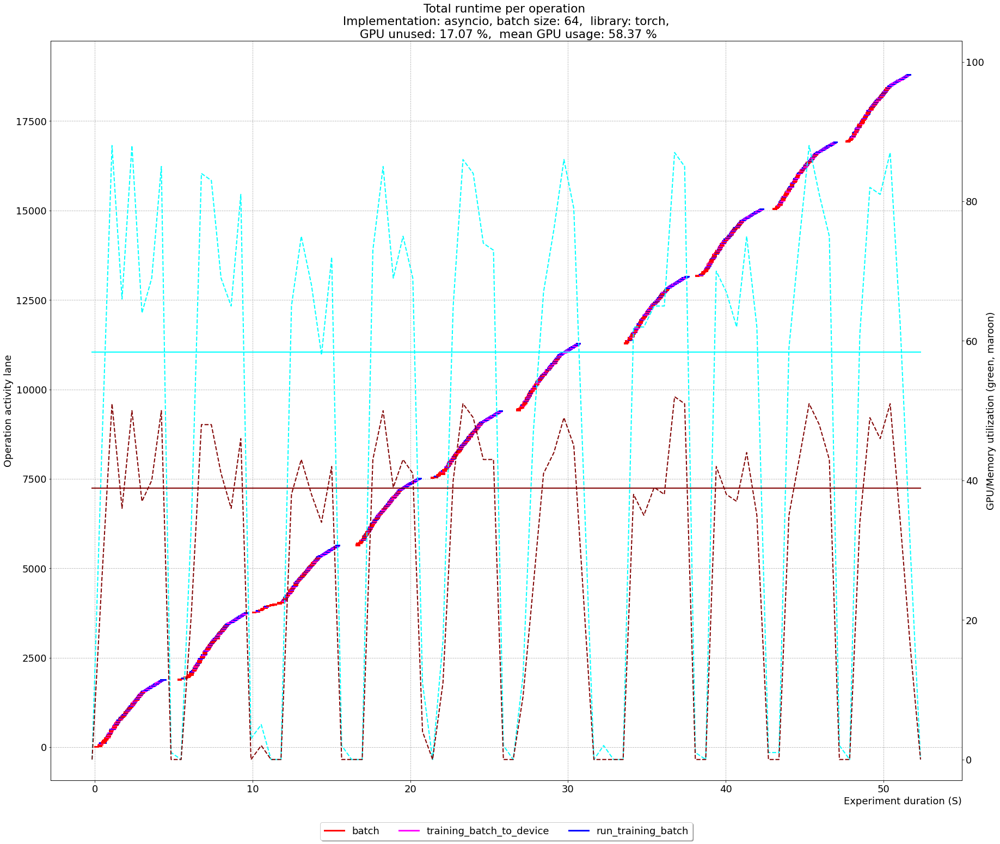

44.30327868852459 14.724137931034482


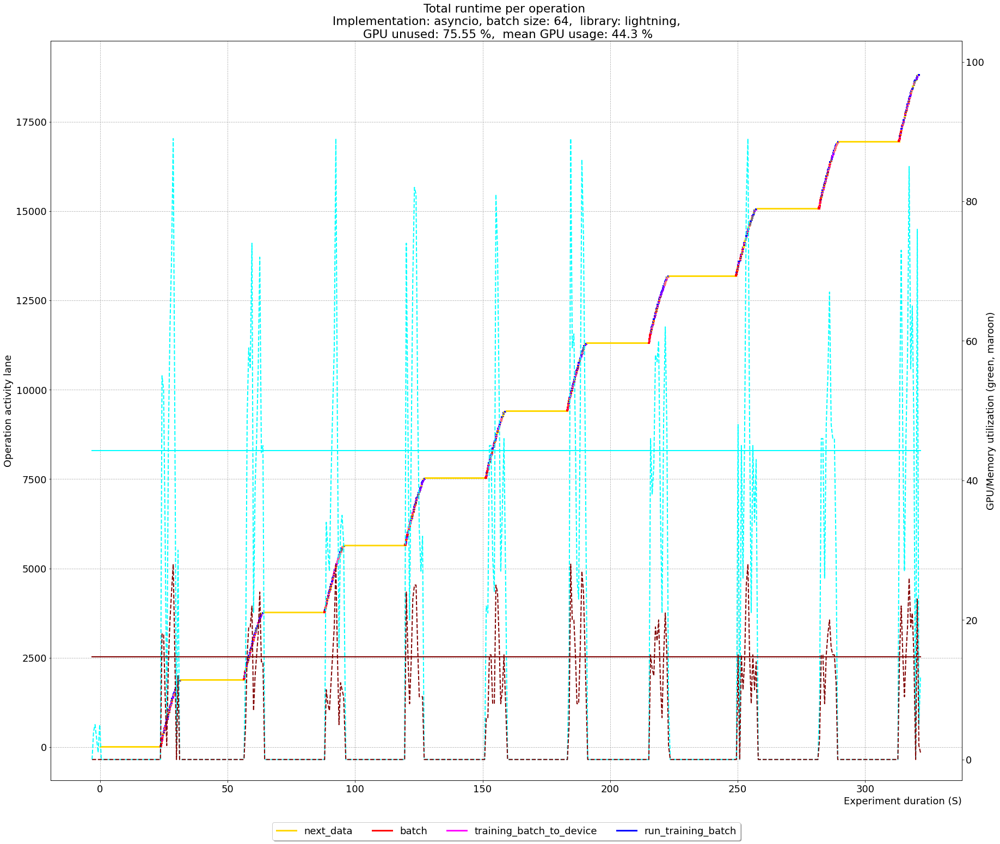

57.69135802469136 32.883116883116884


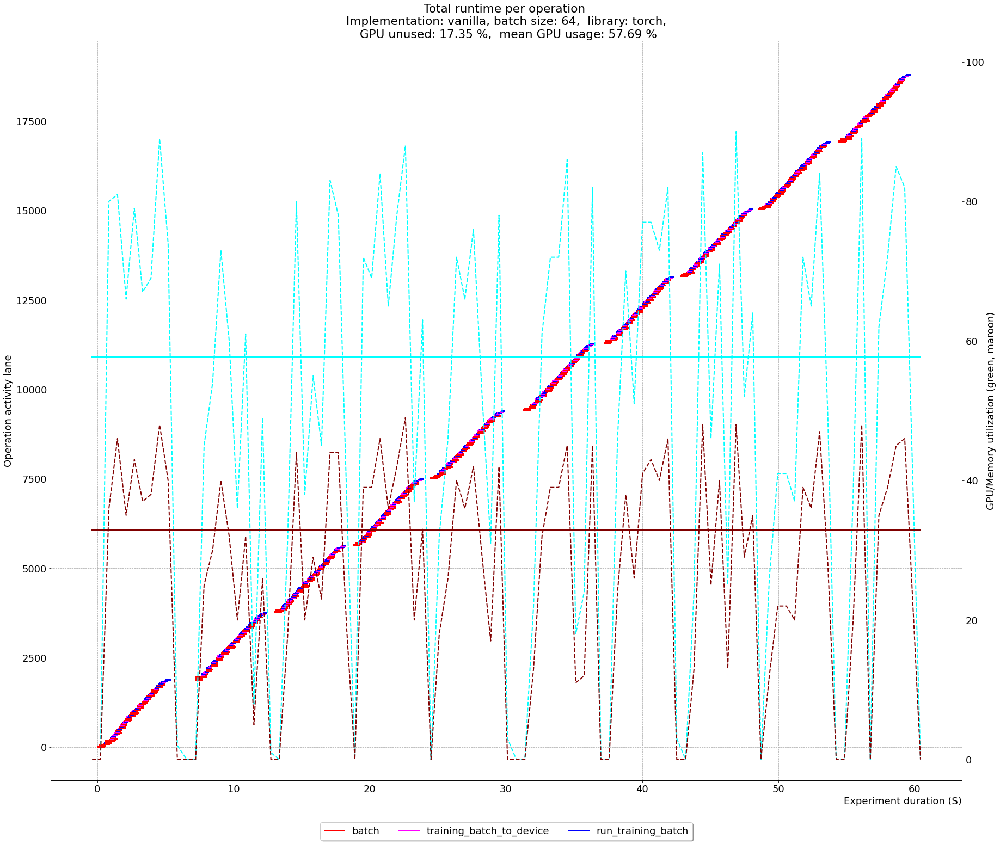

27.665 10.093023255813954


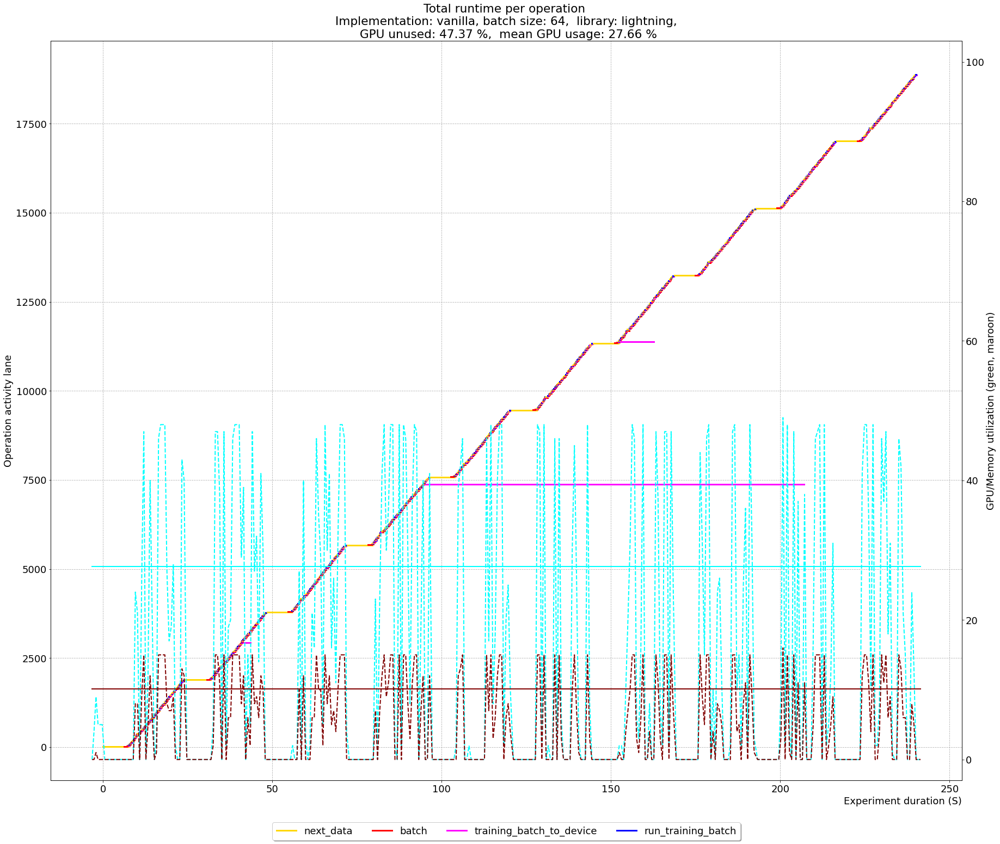

47.64179104477612 30.3


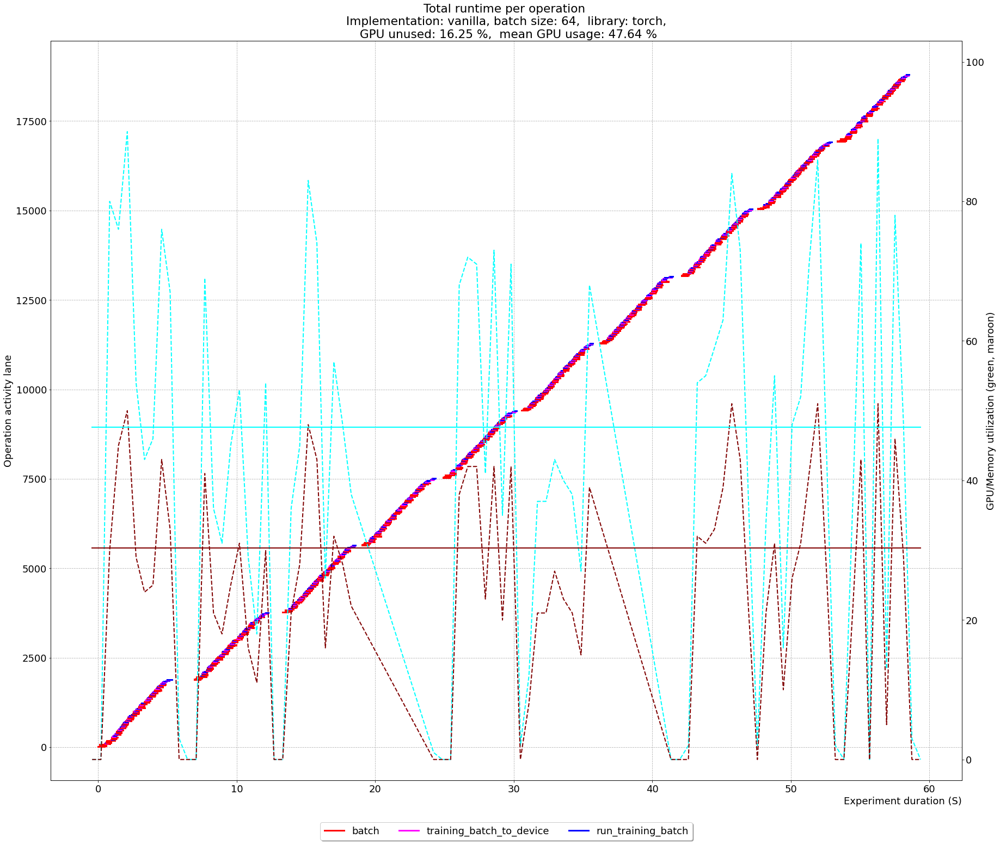

25.585106382978722 9.832258064516129


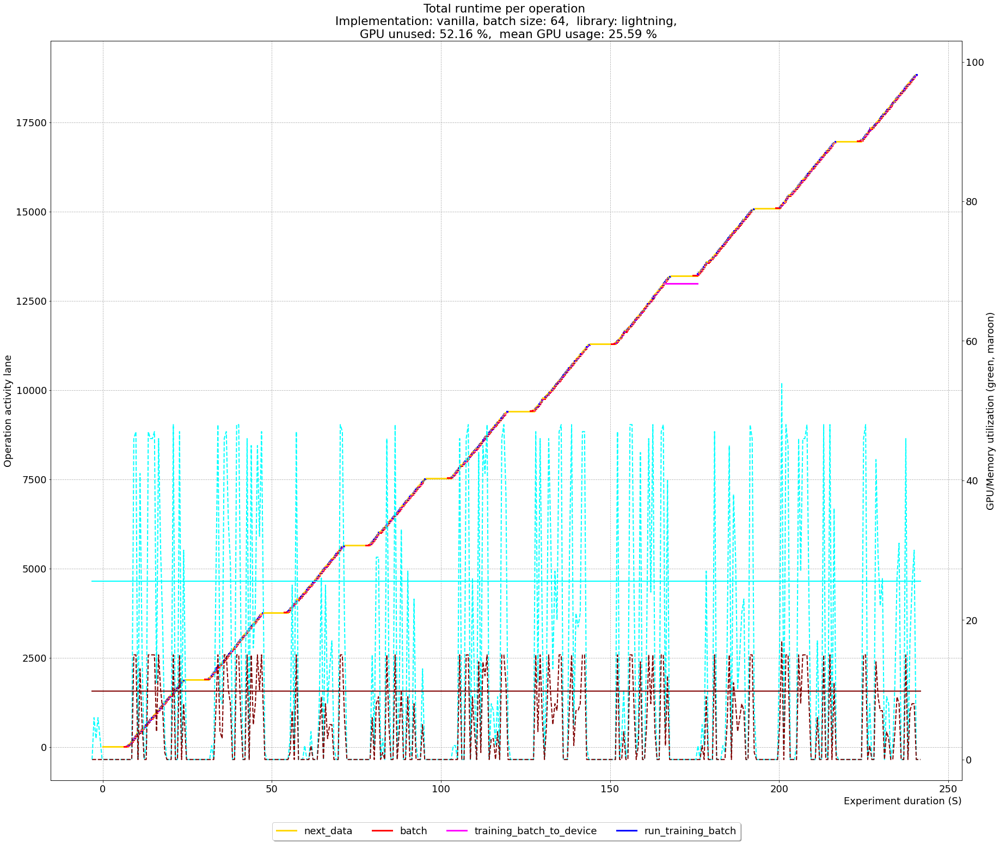

In [25]:
returns_scratch = []
for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    returns_scratch.append(show_timelines_with_gpu(df, dfgpu, run, False, True, False, 1))

In [22]:
results = pd.DataFrame.from_records(data=returns_s3)
samples = 3000
results["throughput"] = 3000 / results["runtime"]
results.sort_values(["runtime", "library"], ascending=True)

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,library,throughput
2,188.620359,83.333333,29.200000,2.433333,14.600000,threaded,torch,15.904964
6,198.716864,74.193548,48.875000,6.806452,26.375000,asyncio,torch,15.096857
4,236.805830,97.297297,7.000000,0.081081,3.000000,asyncio,torch,12.668607
0,256.628621,100.000000,NaN,0.000000,NaN,threaded,torch,11.690045
10,271.375137,95.454545,43.000000,0.931818,41.000000,vanilla,torch,11.054808
3,437.156119,77.142857,30.312500,2.142857,15.000000,threaded,lightning,6.862537
7,440.037896,78.571429,26.533333,1.728571,15.125000,asyncio,lightning,6.817595
1,453.229529,81.690141,30.769231,1.718310,15.250000,threaded,lightning,6.619163
5,453.402001,78.873239,27.333333,1.732394,12.300000,asyncio,lightning,6.616645
8,1154.131736,94.186047,49.200000,1.540698,26.500000,vanilla,torch,2.599357


In [23]:
results = pd.DataFrame.from_records(data=returns_scratch)
results["throughput"] = samples / results["runtime"]
results.sort_values(["runtime", "library"], ascending=True)

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,library,throughput
4,47.671670,50.000000,67.500000,19.000000,38.000000,asyncio,torch,62.930457
2,48.124699,50.000000,65.000000,16.750000,33.500000,threaded,torch,62.338052
0,49.149946,100.000000,NaN,0.000000,NaN,threaded,torch,61.037706
6,51.510633,20.000000,71.750000,32.600000,40.750000,asyncio,torch,58.240403
10,58.377133,40.000000,82.000000,25.000000,41.666667,vanilla,torch,51.389985
8,59.451730,40.000000,75.666667,23.400000,39.000000,vanilla,torch,50.461105
9,240.206525,73.684211,5.600000,0.052632,1.000000,vanilla,lightning,12.489253
11,240.688843,80.000000,4.500000,0.000000,NaN,vanilla,lightning,12.464225
5,320.153303,80.769231,5.200000,0.038462,1.000000,asyncio,lightning,9.370511
7,321.070674,80.769231,3.600000,0.000000,NaN,asyncio,lightning,9.343737
